<a href="https://colab.research.google.com/github/CFVV/UrbanRepresentationLearning-thesis/blob/main/1_RL_create_embeddings_SCL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Spatial Representations - Representation learning Santiago de Chile



The embeddings methos require results from Loader (load features), Regionalizer (split area into regions) and Joiner (join features to regions) to work.

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

In [ ]:
#!pip install -r requirements_urban.txt

In [ ]:
base_path = '/content/drive/MyDrive/UC-TESIS'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue May 14 04:37:41 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Libraries

In [ ]:
!pip install srai[all]
!pip install mplleaflet
!pip install keplergl
!pip install h3

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import Figure,plugins
import io
from PIL import Image
import geopandas as gpd
from shapely.geometry import Point
import os
import mplleaflet
from keplergl import KeplerGl
import scipy
import h3

#To create embeddings
from srai.loaders import OSMOnlineLoader, OSMWayLoader, OSMPbfLoader
from srai.regionalizers import geocode_to_region_gdf, S2Regionalizer
from srai.plotting import plot_regions, plot_numeric_data
from srai.embedders import CountEmbedder, ContextualCountEmbedder,Hex2VecEmbedder, Highway2VecEmbedder
from srai.joiners import IntersectionJoiner
from srai.loaders.osm_loaders.filters import HEX2VEC_FILTER
from srai.neighbourhoods.h3_neighbourhood import H3Neighbourhood
from srai.regionalizers import H3Regionalizer, geocode_to_region_gdf

#models
from pytorch_lightning import seed_everything
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import torch
#import numba
#import umap.umap_ as umap

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
#from osm_data_downloader.src.relation import load_area
#from src.relation import load_area

In [ ]:
SEED = 25
seed_everything(SEED)

INFO:lightning_fabric.utilities.seed:Seed set to 25


25

# I. GET AND VISUALIZE DATA

## Download OSM data for a given region

`OSMOnlineLoader` - downloads data from OpenStreetMap API using osmnx - this is faster for smaller areas or tags counts

`OSMPbfLoader` - loads data from automatically downloaded PBF file from protomaps - this is faster for larger areas or tags counts


(OSM realtions https://nominatim.openstreetmap.org/ui/details.html?osmtype=R&osmid=1758888&class=boundary)

In [ ]:
area_rm = geocode_to_region_gdf("Santiago, Chile") #"Región Metropolitana de Santiago, Chile"
plot_regions(area_rm, tiles_style="CartoDB positron")

### OSM Features

#### Water related

* **natural**: This is used to describe natural and physical land features. These also include features that have been modified by humans.
* **bay**: Named area of water mostly surrounded by land but with level connection to the ocean or a lake.
* **coastline**:	 	The mean high water (springs) line between the sea and land (with the water on the right side of the way)
* **wetland**:	A natural area subject to inundation or with waterlogged ground
* **water**:	 	Any inland body of water, from natural such as a lake or pond to artificial like a moat or canal
* **beach**:	 	landform along a body of water which consists of sand, shingle or other loose material
* **cliff**:	 	A vertical or almost vertical natural drop in terrain, usually with a bare rock surface. The bottom of the cliff is on the right side of the way.

#### Elevation related
The OSM Data Model stores the 2D position (latitude and longitude) of points, and elevation is just an "afterthought" stored in the tag system under the ele=* and its subkeys. The following keys are recommended:

**ele:wgs84=***: Used to store the elevation relative to the WGS84 ellipsoid

Height differences are displayed using contour lines. For better visual identification of the mountains and valleys, slopes are often shaded.
Cartographic representation of strong gradients (cliff escarpment, Cliff, ravine, deep valley) requires special map symbols. This is not feasible with contour lines even with a small contour interval of 10 metres.

#### Roads related
highway': ['primary','secondary',
                           'trunk','unclassified

#### Buildings and facilities related

* **comercial**: A building for non-specific commercial activities, not necessarily an office building. Consider tagging the surrounding area using landuse=commercial if there is such use. Use 'retail' if the building consists primarily of shops.
* **apartments**	A building arranged into individual dwellings, often on separate floors. May also have retail outlets on the ground floor.
* **house**:	A dwelling unit inhabited by a single household (a family or small group sharing facilities such as a kitchen). Houses forming half of a semi-detached pair, or one of a row of terraced houses, should share at least two nodes with joined neighbours, thereby defining the party wall between the properties.
* **residential**:	A general tag for a building used primarily for residential purposes. Where additional detail is available consider using 'apartments', 'terrace', 'house', 'detached' or 'semidetached_house'.
* **hotel**:	A building designed with separate rooms available for overnight accommodation. Normally used in conjunction with tourism=hotel for the hotel grounds including recreation areas and parking.
* **dormitory**:	A shared building intended for college/university students (not a share room for multiple occupants as implied by the term in British English). Alternatively, use building=residential plus residential=university and loose the information that it is for students.
* **supermarket**:	A building constructed to house a self-service large-area store.
* **office**:	An office building. Use office=* where applicable for the business(es) that use the building. Consider tagging the surrounding area using landuse=commercial if it applies. Prefer landuse=retail if the building consists primarily of shops.
* **retail**:	A building primarily used for selling goods that are sold to the public; use shop=* to identify the sort of goods sold or an appropriate amenity=* (pub, cafe, restaurant, etc.). Consider use landuse=retail for the surrounding area.
*  **religious = ***	A building that was built as a cathedral. Used in conjunction with amenity=place_of_worship, religion=*, denomination=* and landuse=religious for the cathedral grounds where it is in current use.
*  **fire_station**:	A building constructed as fire station, i.e. to house fire fighting equipment and officers, regardless of current use. Add amenity=fire_station on the grounds for an active fire station.
* **hospital:**	A building errected for a hospital. Use amenity=hospital for the hospital grounds.
* **school**:	A building errected as school. Buildings for specific uses (sports halls etc.) should be tagged for their purpose. If there is currently a school, use amenity=school on the perimeter of the school grounds.

In [ ]:
query_amenities = {	"amenity" :["bar", "canteen", "fast_fodd", "pub",
                                "cafe","food_court", "restaurant",
                                "kindergarten", "music_school","school",
                                	"college", "library","university",
                                "bicycle_parking","bicycle_rental","bus_station",
                                "fuel","parking", "bank", "clinic", "dentist",
                                "doctors", "hospital","pharmacy","veterinary",
                                "social_facility","cinema","theatre","police",
                                "townhall"]}

query_buildings = {"building": ["apartments","house", "commercial",
                                "hotel","residential","dormitory",
                                "industrial","office","retail",
                                "supermarket","church","religious",
                                "hospital", "kindergarten", "train_station",
                                "university","parking", "bridge"]}

query_highway = {	"highway": ["motorway","roads","paths",
                              "primary","secondary","trunk",
                              "cycleway"]}

query_landuse = {"landuse": ["commercial", "education", "industrial",
                             "residential", "retail"]}

query_natural = {"natural" : ["water","beach","cliff", "wood"],
               "waterway": ["river","stream","canal","ditch"],
                 "leisure": ["park","playground"],
                 "place": ["square"]}

query_shop = {"shop" : ["bakery","convenience","food",
                        "general", "mall","supermarket",
                        "clothes", "second_hand", "beauty",
                        "hairdresser", "electronics"]}

# RM Santiago de Chile



## Santiago data

## 1.OSM Features

In [ ]:
loader = OSMPbfLoader()

### 1.1 Amenities features

In [ ]:
feat_rm_query_amenities = loader.load(area_rm, query_amenities)

/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/bbbike.py:50: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["area"] = gdf.geometry.area
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/osm_fr.py:54: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf["area"] = gdf.geometry.area
/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/__init__.py:498: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION 

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:32

In [ ]:
feat_rm_query_amenities

,geometry,amenity
feature_id,,
node/253281762,POINT (-70.65687 -33.44062),parking
node/335617944,POINT (-70.66010 -33.47337),parking
node/335617945,POINT (-70.65758 -33.47317),parking
node/348646666,POINT (-70.64109 -33.44398),parking
node/369947096,POINT (-70.65965 -33.43230),parking
...,...,...
relation/7779937,"POLYGON ((-70.65681 -33.43334, -70.65678 -33.4...",police
relation/15569837,"POLYGON ((-70.66511 -33.44644, -70.66518 -33.4...",college
relation/8413867,"MULTIPOLYGON (((-70.66365 -33.45445, -70.66359...",kindergarten


In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_amenities.explore(m=folium_map, color="pink")

In [ ]:
#Save features
feat_rm_query_amenities.to_csv(f'{base_path}/data/feat_rm_query_amenities.csv')

### 1.2   Building features

In [ ]:
feat_rm_query_buildings = loader.load(area_rm, query_buildings)

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/__init__.py:498: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION EMPTY' instead.
  ].unary_union


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:36

In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_buildings.explore(m=folium_map, color="magenta")

In [ ]:
#Save features
feat_rm_query_buildings.to_csv(f'{base_path}/data/feat_rm_query_buildings.csv')

### 1.3   Highway features

In [ ]:
feat_rm_query_highway = loader.load(area_rm, query_highway)

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/__init__.py:498: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION EMPTY' instead.
  ].unary_union


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:29

In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_highway.explore(m=folium_map, color="lightblue")

In [ ]:
#Save features
feat_rm_query_highway.to_csv(f'{base_path}/data/feat_rm_query_highway.csv')

### 1.4 Landuse features

In [ ]:
feat_rm_query_landuse = loader.load(area_rm, query_landuse)

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/__init__.py:498: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION EMPTY' instead.
  ].unary_union


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:39

In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_landuse.explore(m=folium_map, color="blue")

In [ ]:
#Save features
feat_rm_query_landuse.to_csv(f'{base_path}/data/feat_rm_query_landuse.csv')

### 1.5 Natural features

In [ ]:
feat_rm_query_natural = loader.load(area_rm, query_natural)

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/quackosm/osm_extracts/__init__.py:498: FutureWarning: `unary_union` returned None due to all-None GeoSeries. In future, `unary_union` will return 'GEOMETRYCOLLECTION EMPTY' instead.
  ].unary_union


Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:34

In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_natural.explore(m=folium_map, color="green")

In [ ]:
#Save features
feat_rm_query_natural.to_csv(f'{base_path}/data/feat_rm_query_natural.csv')

### 1.6 Shop features

In [ ]:
feat_rm_query_shop = loader.load(area_rm, query_shop)

⠹ [   1/32] Reading nodes • 0:00:00

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is 
incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Output()

Finished operation in 0:00:35

In [ ]:
folium_map = plot_regions(area_rm, colormap=["lightgray"], tiles_style="CartoDB positron")
feat_rm_query_shop.explore(m=folium_map, color="orange")

In [ ]:
#Save features
feat_rm_query_shop.to_csv(f'{base_path}/data/feat_rm_query_shop.csv')

## Read saved features

In [ ]:
#read files
feat_rm_query_amenities = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_amenities.csv", index_col=0)
feat_rm_query_buildings = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_buildings.csv", index_col=0)
feat_rm_query_highway = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_highway.csv", index_col=0)
feat_rm_query_landuse = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_landuse.csv", index_col=0)
feat_rm_query_natural = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_natural.csv", index_col=0)
feat_rm_query_shop = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/osm_features/feat_rm_query_shop.csv", index_col=0)

#to geodataframe
feat_rm_query_amenities['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_amenities['geometry'])
feat_rm_query_amenities = gpd.GeoDataFrame(feat_rm_query_amenities)

feat_rm_query_buildings['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_buildings['geometry'])
feat_rm_query_buildings = gpd.GeoDataFrame(feat_rm_query_buildings)

feat_rm_query_highway['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_highway['geometry'])
feat_rm_query_highway = gpd.GeoDataFrame(feat_rm_query_highway)

feat_rm_query_landuse['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_landuse['geometry'])
feat_rm_query_landuse = gpd.GeoDataFrame(feat_rm_query_landuse)

feat_rm_query_natural['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_natural['geometry'])
feat_rm_query_natural = gpd.GeoDataFrame(feat_rm_query_natural)

feat_rm_query_shop['geometry'] = gpd.GeoSeries.from_wkt(feat_rm_query_shop['geometry'])
feat_rm_query_shop = gpd.GeoDataFrame(feat_rm_query_shop)

## 2.Get dummy variables

### 2.1 Amenities

In [ ]:
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_amenities_dummy = pd.get_dummies(data=feat_rm_query_amenities,
columns=[col for col in feat_rm_query_amenities.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_amenities_dummy

,geometry,amenity_bar,amenity_bicycle_parking,amenity_bicycle_rental,amenity_bus_station,amenity_cafe,amenity_cinema,amenity_clinic,amenity_college,amenity_dentist,...,amenity_pharmacy,amenity_police,amenity_pub,amenity_restaurant,amenity_school,amenity_social_facility,amenity_theatre,amenity_townhall,amenity_university,amenity_veterinary
feature_id,,,,,,,,,,,,,,,,,,,,,
node/253281762,POINT (-70.65687 -33.44062),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/335617944,POINT (-70.66010 -33.47337),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/335617945,POINT (-70.65758 -33.47317),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/348646666,POINT (-70.64109 -33.44398),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/369947096,POINT (-70.65965 -33.43230),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
relation/7779937,"POLYGON ((-70.65681 -33.43334, -70.65678 -33.4...",False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
relation/15569837,"POLYGON ((-70.66511 -33.44644, -70.66518 -33.4...",False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
relation/8413867,"MULTIPOLYGON (((-70.66365 -33.45445, -70.66359...",False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_amenities_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_amenities_dummy= gdf_amenities_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_amenities_dummy


,geometry,amenity_bar,amenity_bicycle_parking,amenity_bicycle_rental,amenity_bus_station,amenity_cafe,amenity_cinema,amenity_clinic,amenity_college,amenity_dentist,...,amenity_pharmacy,amenity_police,amenity_pub,amenity_restaurant,amenity_school,amenity_social_facility,amenity_theatre,amenity_townhall,amenity_university,amenity_veterinary
feature_id,,,,,,,,,,,,,,,,,,,,,
node/253281762,POINT (-70.65687 -33.44062),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/335617944,POINT (-70.66010 -33.47337),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/335617945,POINT (-70.65758 -33.47317),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/348646666,POINT (-70.64109 -33.44398),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
node/369947096,POINT (-70.65965 -33.43230),False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
relation/7779937,"POLYGON ((-70.65681 -33.43334, -70.65678 -33.4...",False,False,False,False,False,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
relation/15569837,"POLYGON ((-70.66511 -33.44644, -70.66518 -33.4...",False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
relation/8413867,"MULTIPOLYGON (((-70.66365 -33.45445, -70.66359...",False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### 2.2 Building

In [ ]:
# Get dummy variables
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_buildings_dummy = pd.get_dummies(data=feat_rm_query_buildings,
columns=[col for col in feat_rm_query_buildings.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_buildings_dummy

,geometry,building_bridge,building_church,building_commercial,building_hospital,building_hotel,building_house,building_industrial,building_kindergarten,building_office,building_residential,building_retail,building_supermarket,building_train_station,building_university
feature_id,,,,,,,,,,,,,,,
node/3058070518,POINT (-70.66118 -33.44768),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070519,POINT (-70.66127 -33.44734),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070520,POINT (-70.66125 -33.44743),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070521,POINT (-70.66127 -33.44739),False,False,True,False,False,False,False,False,False,False,False,False,False,False
way/37248621,"POLYGON ((-70.64522 -33.47555, -70.64517 -33.4...",False,False,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
relation/17174865,"MULTIPOLYGON (((-70.65214 -33.43853, -70.65215...",False,False,True,False,False,False,False,False,False,False,False,False,False,False
relation/5500693,"POLYGON ((-70.66287 -33.45299, -70.66286 -33.4...",False,False,False,False,False,False,False,False,False,False,False,False,False,False
relation/15903428,"POLYGON ((-70.65882 -33.44827, -70.65879 -33.4...",False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_buildings_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_buildings_dummy= gdf_buildings_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_buildings_dummy

,geometry,building_bridge,building_church,building_commercial,building_hospital,building_hotel,building_house,building_industrial,building_kindergarten,building_office,building_residential,building_retail,building_supermarket,building_train_station,building_university
feature_id,,,,,,,,,,,,,,,
node/3058070518,POINT (-70.66118 -33.44768),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070519,POINT (-70.66127 -33.44734),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070520,POINT (-70.66125 -33.44743),False,False,True,False,False,False,False,False,False,False,False,False,False,False
node/3058070521,POINT (-70.66127 -33.44739),False,False,True,False,False,False,False,False,False,False,False,False,False,False
way/37248621,"POLYGON ((-70.64522 -33.47555, -70.64517 -33.4...",False,False,True,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
relation/10074054,"POLYGON ((-70.65069 -33.43667, -70.65069 -33.4...",False,False,True,False,False,False,False,False,False,False,False,False,False,False
relation/6836128,"POLYGON ((-70.65608 -33.44458, -70.65611 -33.4...",False,False,False,False,False,False,False,False,True,False,False,False,False,False
relation/17174865,"MULTIPOLYGON (((-70.65214 -33.43853, -70.65215...",False,False,True,False,False,False,False,False,False,False,False,False,False,False


### 2.3 Highway

In [ ]:
# Get dummy variables
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_highway_dummy = pd.get_dummies(data=feat_rm_query_highway,
columns=[col for col in feat_rm_query_highway.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_highway_dummy

,geometry,highway_motorway,highway_primary,highway_secondary
feature_id,,,,
way/353008506,"LINESTRING (-70.66083 -33.44631, -70.66088 -33...",False,False,False
way/626756847,"LINESTRING (-70.65763 -33.45889, -70.65766 -33...",False,True,False
way/626770081,"LINESTRING (-70.67295 -33.47062, -70.67251 -33...",False,True,False
way/679088054,"LINESTRING (-70.64348 -33.43798, -70.64350 -33...",False,True,False
way/679088063,"LINESTRING (-70.64341 -33.43646, -70.64338 -33...",False,True,False
...,...,...,...,...
way/860911767,"LINESTRING (-70.66478 -33.44482, -70.66479 -33...",False,False,True
way/984978267,"LINESTRING (-70.66505 -33.45410, -70.66505 -33...",False,False,True
way/1036644324,"LINESTRING (-70.65108 -33.44744, -70.65118 -33...",False,True,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_highway_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_highway_dummy= gdf_highway_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_highway_dummy

,geometry,highway_motorway,highway_primary,highway_secondary
feature_id,,,,
way/626756847,"LINESTRING (-70.65763 -33.45889, -70.65766 -33...",False,True,False
way/626770081,"LINESTRING (-70.67295 -33.47062, -70.67251 -33...",False,True,False
way/679088054,"LINESTRING (-70.64348 -33.43798, -70.64350 -33...",False,True,False
way/679088063,"LINESTRING (-70.64341 -33.43646, -70.64338 -33...",False,True,False
way/679088072,"LINESTRING (-70.64306 -33.43550, -70.64310 -33...",False,True,False
...,...,...,...,...
way/860911767,"LINESTRING (-70.66478 -33.44482, -70.66479 -33...",False,False,True
way/984978267,"LINESTRING (-70.66505 -33.45410, -70.66505 -33...",False,False,True
way/1036644324,"LINESTRING (-70.65108 -33.44744, -70.65118 -33...",False,True,False


### 2.4 Landuse

In [ ]:
# Get dummy variables
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_landuse_dummy = pd.get_dummies(data=feat_rm_query_landuse,
columns=[col for col in feat_rm_query_landuse.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_landuse_dummy

,geometry,landuse_industrial,landuse_residential,landuse_retail
feature_id,,,,
node/10882467343,POINT (-70.66614 -33.45618),False,True,False
way/36767279,"POLYGON ((-70.63227 -33.47225, -70.63227 -33.4...",True,False,False
way/123419696,"POLYGON ((-70.65836 -33.46129, -70.65837 -33.4...",False,False,True
way/154638896,"POLYGON ((-70.66438 -33.45821, -70.66437 -33.4...",False,False,True
way/154639317,"POLYGON ((-70.66387 -33.45648, -70.66403 -33.4...",False,False,True
...,...,...,...,...
way/1183820847,"POLYGON ((-70.64541 -33.44514, -70.64434 -33.4...",False,False,False
way/599952893,"POLYGON ((-70.67866 -33.46349, -70.67865 -33.4...",True,False,False
way/300534275,"POLYGON ((-70.65916 -33.45383, -70.65931 -33.4...",False,False,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_landuse_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_landuse_dummy= gdf_landuse_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_landuse_dummy

,geometry,landuse_industrial,landuse_residential,landuse_retail
feature_id,,,,
node/10882467343,POINT (-70.66614 -33.45618),False,True,False
way/123419696,"POLYGON ((-70.65836 -33.46129, -70.65837 -33.4...",False,False,True
way/154638896,"POLYGON ((-70.66438 -33.45821, -70.66437 -33.4...",False,False,True
way/154639317,"POLYGON ((-70.66387 -33.45648, -70.66403 -33.4...",False,False,True
way/302354240,"POLYGON ((-70.65922 -33.45359, -70.65908 -33.4...",False,True,False
...,...,...,...,...
way/1184326014,"POLYGON ((-70.64991 -33.45275, -70.64976 -33.4...",False,False,True
way/1195081218,"POLYGON ((-70.65762 -33.45448, -70.65678 -33.4...",False,False,True
way/1037187425,"POLYGON ((-70.66416 -33.45561, -70.66414 -33.4...",False,True,False


### 2.5 Natural

In [ ]:
# Get dummy variables
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_natural_dummy = pd.get_dummies(data=feat_rm_query_natural,
columns=[col for col in feat_rm_query_natural.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_natural_dummy

,geometry,leisure_playground,natural_water,natural_wood,waterway_stream
feature_id,,,,,
node/1648022234,POINT (-70.63304 -33.47391),True,False,False,False
node/1906205566,POINT (-70.65517 -33.45251),True,False,False,False
node/1906205635,POINT (-70.65363 -33.45199),True,False,False,False
node/2253429173,POINT (-70.64099 -33.43879),True,False,False,False
node/2295148028,POINT (-70.67110 -33.42779),True,False,False,False
...,...,...,...,...,...
relation/10272414,"POLYGON ((-70.64965 -33.43826, -70.64963 -33.4...",False,False,False,False
relation/15579673,"MULTIPOLYGON (((-70.65966 -33.44579, -70.66013...",False,False,False,False
relation/7779620,"POLYGON ((-70.64276 -33.43493, -70.64277 -33.4...",False,False,False,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_natural_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_natural_dummy= gdf_natural_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_natural_dummy

,geometry,leisure_playground,natural_water,natural_wood,waterway_stream
feature_id,,,,,
way/1156711819,"POLYGON ((-70.65878 -33.46338, -70.65877 -33.4...",False,False,True,False
way/1156711822,"POLYGON ((-70.65919 -33.46500, -70.65897 -33.4...",False,False,True,False
way/1156715494,"POLYGON ((-70.65874 -33.46342, -70.65842 -33.4...",False,False,True,False
way/621762059,"POLYGON ((-70.66346 -33.44680, -70.66352 -33.4...",False,True,False,False
way/905645664,"POLYGON ((-70.66880 -33.46591, -70.66878 -33.4...",False,True,False,False
way/1106639654,"POLYGON ((-70.65100 -33.45161, -70.65100 -33.4...",False,True,False,False
way/1156715485,"POLYGON ((-70.65871 -33.46534, -70.65869 -33.4...",False,False,True,False
way/1156717299,"POLYGON ((-70.65994 -33.45990, -70.65977 -33.4...",False,False,True,False
way/584070964,"POLYGON ((-70.67190 -33.47621, -70.67179 -33.4...",False,True,False,False


In [ ]:
print("Size of the initial dataset after get_dummies:", gdf_natural_dummy.shape)
print("Size of the new filtered_df DataFrame:", filter_gdf_natural_dummy.shape)
print("Number of rows removed without True values:", gdf_natural_dummy.shape[0] - filter_gdf_natural_dummy.shape[0],
 ",this is an", round(((gdf_natural_dummy.shape[0] - filter_gdf_natural_dummy.shape[0]) / gdf_natural_dummy.shape[0]) * 100, 2), "%")

Size of the initial dataset after get_dummies: (238, 5)
Size of the new filtered_df DataFrame: (51, 5)
Number of rows removed without True values: 187 ,this is an 78.57 %


### 2.6 Shop

In [ ]:
# Get dummy variables
# columns not to transform
not_cols = ['feature_id', 'geometry']

# get dummies
gdf_shop_dummy = pd.get_dummies(data=feat_rm_query_shop,
columns=[col for col in feat_rm_query_shop.columns if col not in not_cols],
prefix_sep='_', drop_first=True)

gdf_shop_dummy

,geometry,shop_beauty,shop_clothes,shop_convenience,shop_electronics,shop_food,shop_general,shop_hairdresser,shop_mall,shop_second_hand,shop_supermarket
feature_id,,,,,,,,,,,
node/256041610,POINT (-70.63749 -33.44316),False,False,False,False,False,False,False,False,False,True
node/612587351,POINT (-70.63936 -33.44089),False,False,False,False,False,False,False,False,False,True
node/889745743,POINT (-70.64760 -33.43712),False,False,False,False,False,False,False,False,False,True
node/890537558,POINT (-70.64545 -33.44021),False,False,True,False,False,False,False,False,False,False
node/890537859,POINT (-70.64550 -33.43922),False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
way/1024365233,"POLYGON ((-70.65297 -33.47239, -70.65297 -33.4...",False,False,False,False,False,True,False,False,False,False
way/446611574,"POLYGON ((-70.63166 -33.45022, -70.63152 -33.4...",False,False,False,False,False,False,False,False,False,True
way/449274996,"POLYGON ((-70.67777 -33.45440, -70.67781 -33.4...",False,True,False,False,False,False,False,False,False,False


In [ ]:
##Check if there's at least one "True" value in each row and delete rows without information

# Check if there's at least one "True" value in each row
any_true_per_row = gdf_shop_dummy.iloc[:, 2:].any(axis=1)

# Filter the DataFrame by removing rows without any "True" value
filter_gdf_shop_dummy= gdf_shop_dummy[any_true_per_row]

# Print the filtered DataFrame
filter_gdf_shop_dummy

,geometry,shop_beauty,shop_clothes,shop_convenience,shop_electronics,shop_food,shop_general,shop_hairdresser,shop_mall,shop_second_hand,shop_supermarket
feature_id,,,,,,,,,,,
node/256041610,POINT (-70.63749 -33.44316),False,False,False,False,False,False,False,False,False,True
node/612587351,POINT (-70.63936 -33.44089),False,False,False,False,False,False,False,False,False,True
node/889745743,POINT (-70.64760 -33.43712),False,False,False,False,False,False,False,False,False,True
node/890537558,POINT (-70.64545 -33.44021),False,False,True,False,False,False,False,False,False,False
node/890537859,POINT (-70.64550 -33.43922),False,False,True,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
way/1024365233,"POLYGON ((-70.65297 -33.47239, -70.65297 -33.4...",False,False,False,False,False,True,False,False,False,False
way/446611574,"POLYGON ((-70.63166 -33.45022, -70.63152 -33.4...",False,False,False,False,False,False,False,False,False,True
way/449274996,"POLYGON ((-70.67777 -33.45440, -70.67781 -33.4...",False,True,False,False,False,False,False,False,False,False


In [ ]:
print("Size of the initial dataset after get_dummies:", gdf_shop_dummy.shape)
print("Size of the new filtered_df DataFrame:", filter_gdf_shop_dummy.shape)
print("Number of rows removed without True values:", gdf_shop_dummy.shape[0] - filter_gdf_shop_dummy.shape[0],
 ",this is an", round(((gdf_shop_dummy.shape[0] - filter_gdf_shop_dummy.shape[0]) / gdf_shop_dummy.shape[0]) * 100, 2), "%")

Size of the initial dataset after get_dummies: (600, 11)
Size of the new filtered_df DataFrame: (518, 11)
Number of rows removed without True values: 82 ,this is an 13.67 %


In [ ]:
#check random rows
import random
random_index = random.randint(0, len(filter_gdf_natural_dummy) - 1)
random_row = gdf_amenities_dummy.iloc[random_index]
random_row

geometry                   POINT (-70.6577298 -33.4481203)
amenity_bar                                          False
amenity_bicycle_parking                              False
amenity_bicycle_rental                               False
amenity_bus_station                                  False
amenity_cafe                                         False
amenity_cinema                                       False
amenity_clinic                                       False
amenity_college                                       True
amenity_dentist                                      False
amenity_doctors                                      False
amenity_food_court                                   False
amenity_fuel                                         False
amenity_hospital                                     False
amenity_kindergarten                                 False
amenity_library                                      False
amenity_parking                                      Fal

# II. REGIONALIZER H3
## Regionize given region with Hexagonal Hierarchical Spatial Index (H3)
The H3 spatial index was chosen as separating the space into hexagons allows regions to an edge with all their neighbors, and the distance between the center of each region and the centers of each of its neighbors is the same.

`Resolution=8` is a good trade-off between generalization and noise.
* **small regions** --> to capture single water objects, and as a consequence, the region embedding would be the same as a single water object embedding.

* **large regions** --> contain water elements of many different types and characteristics, leading to little regional variation.

## rm H3 hexagons

* **buffer=False** Regionalize using H3 without buffering: Polygons are not fully covered in H3 cells

* **buffer=True** Regionalize using H3 with buffering (default)
Polygons are now properly covered in H3 cells




#### Regionalizer resolution: 8,9 y 10

**resolution = 8**

* Average Hexagon Area (km2):

 0.73732
(737,327.5m2)


* Average edge length (Km):

 0.531414


In [ ]:
regionalizer = H3Regionalizer(resolution=8, buffer=True)
regions_gdf_rm_8 = regionalizer.transform(area_rm)
plot_regions(regions_gdf_rm_8, tiles_style="CartoDB positron")

**resolution = 9**

* Average Hexagon Area (km2):

0.10533251
(105,332.5m2)

* Average edge length (Km):

0.20078


In [ ]:
regionalizer = H3Regionalizer(resolution=9, buffer=True)
regions_gdf_rm_9 = regionalizer.transform(area_rm)
plot_regions(regions_gdf_rm_9, tiles_style="CartoDB positron")

**resolution = 10**

* Average Hexagon Area (km2):

0.0150
(15,047.5m2)

* Average edge length (Km):

0.0758


In [ ]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
regions_gdf_rm_10 = regionalizer.transform(area_rm)
plot_regions(regions_gdf_rm_10, tiles_style="CartoDB positron")

### JOIN: Find out which edges correspond to which regions

Join H3 regions + OSM features

In [ ]:
regions_gdf_rm_8

,geometry
region_id,
88b2c556a7fffff,"POLYGON ((-70.63721 -33.43154, -70.64162 -33.4..."
88b2c55407fffff,"POLYGON ((-70.68074 -33.43228, -70.68516 -33.4..."
88b2c55433fffff,"POLYGON ((-70.67317 -33.45062, -70.67758 -33.4..."
88b2c554a9fffff,"POLYGON ((-70.65613 -33.46737, -70.66054 -33.4..."
88b2c55417fffff,"POLYGON ((-70.65992 -33.44187, -70.66433 -33.4..."
88b2c555d9fffff,"POLYGON ((-70.67695 -33.45778, -70.68137 -33.4..."
88b2c5542bfffff,"POLYGON ((-70.69021 -33.43386, -70.69463 -33.4..."
88b2c55457fffff,"POLYGON ((-70.65803 -33.42195, -70.66245 -33.4..."
88b2c55489fffff,"POLYGON ((-70.63342 -33.45704, -70.63783 -33.4..."


In [ ]:
regions_gdf_rm_9

,geometry
region_id,
89b2c554073ffff,"POLYGON ((-70.68074 -33.43228, -70.68191 -33.4..."
89b2c554e7bffff,"POLYGON ((-70.66505 -33.46326, -70.66622 -33.4..."
89b2c55484bffff,"POLYGON ((-70.65018 -33.47010, -70.65135 -33.4..."
89b2c554143ffff,"POLYGON ((-70.66587 -33.43913, -70.66704 -33.4..."
89b2c554013ffff,"POLYGON ((-70.67696 -33.42511, -70.67813 -33.4..."
...,...
89b2c554e13ffff,"POLYGON ((-70.65802 -33.45462, -70.65919 -33.4..."
89b2c554ecfffff,"POLYGON ((-70.66424 -33.45473, -70.66541 -33.4..."
89b2c554237ffff,"POLYGON ((-70.69102 -33.44240, -70.69219 -33.4..."


In [ ]:
regions_gdf_rm_10

,geometry
region_id,
8ab2c5543267fff,"POLYGON ((-70.66911 -33.45461, -70.66974 -33.4..."
8ab2c554199ffff,"POLYGON ((-70.65532 -33.43084, -70.65595 -33.4..."
8ab2c554c137fff,"POLYGON ((-70.63531 -33.44429, -70.63594 -33.4..."
8ab2c5540657fff,"POLYGON ((-70.67858 -33.43752, -70.67921 -33.4..."
8ab2c555d337fff,"POLYGON ((-70.67506 -33.47053, -70.67569 -33.4..."
...,...
8ab2c554e0f7fff,"POLYGON ((-70.65856 -33.46031, -70.65919 -33.4..."
8ab2c554c0b7fff,"POLYGON ((-70.63883 -33.44861, -70.63946 -33.4..."
8ab2c554155ffff,"POLYGON ((-70.66235 -33.43948, -70.66298 -33.4..."


### No dummy features


All OSM

#### joint_rm_gdf_amenities

In [ ]:
#OSM+REGIONS r=8
joiner = IntersectionJoiner()
joint_rm_gdf_amenities_8 = joiner.transform(regions_gdf_rm_8,feat_rm_query_amenities)
joint_rm_gdf_amenities_8

/usr/local/lib/python3.10/dist-packages/srai/joiners/intersection_joiner.py:101: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  gpd.sjoin(


Empty DataFrame
Columns: []
Index: [(88b2c554c5fffff, way/449596579), (88b2c554c5fffff, way/449590631), (88b2c554ebfffff, way/449590631), (88b2c554c5fffff, node/10826162204), (88b2c554c5fffff, node/4465365888), (88b2c554c5fffff, node/906430347), (88b2c554c5fffff, node/4465561575), (88b2c554c5fffff, node/5319185423), (88b2c554c5fffff, way/810580870), (88b2c554c5fffff, node/8564386697), (88b2c554c5fffff, node/8564386698), (88b2c554c5fffff, node/8564386700), (88b2c554c5fffff, node/8564386695), (88b2c554c5fffff, way/923192667), (88b2c554c5fffff, way/317559833), (88b2c554c5fffff, way/922317109), (88b2c554c5fffff, node/5220189223), (88b2c554c5fffff, node/10876111741), (88b2c554c5fffff, way/448190522), (88b2c554c5fffff, node/4448367824), (88b2c554c5fffff, node/6097005435), (88b2c554c5fffff, node/6097005255), (88b2c554c5fffff, node/5220189233), (88b2c554c5fffff, node/3459452961), (88b2c554c5fffff, node/9288727286), (88b2c554c5fffff, node/10959662218), (88b2c554c5fffff, node/4453713400), (88b2c554c5fffff, node/7619065566), (88b2c554c5fffff, node/7907147887), (88b2c554c5fffff, node/3663941035), (88b2c554c5fffff, node/5827477085), (88b2c554c5fffff, node/10960157815), (88b2c554c5fffff, node/3700536556), (88b2c554c5fffff, node/3902495689), (88b2c554c5fffff, node/2188728364), (88b2c554c5fffff, node/4444322072), (88b2c554c5fffff, node/5935351779), (88b2c554c5fffff, node/3663940525), (88b2c554c5fffff, node/4456639665), (88b2c554c5fffff, way/448217174), (88b2c554c5fffff, node/3663926982), (88b2c554c5fffff, way/447239136), (88b2c554cdfffff, way/447239136), (88b2c554c5fffff, node/11082199317), (88b2c554c5fffff, way/327751603), (88b2c554c5fffff, way/317576834), (88b2c554c5fffff, way/317576831), (88b2c554c5fffff, node/906430298), (88b2c554c5fffff, node/5700760420), (88b2c554c5fffff, node/6101401479), (88b2c554c5fffff, way/1173043623), (88b2c554c5fffff, node/6097010647), (88b2c554c5fffff, node/5700760631), (88b2c554c5fffff, way/561377054), (88b2c554c5fffff, node/5000931521), (88b2c554c5fffff, node/3255595362), (88b2c554c5fffff, node/4465566419), (88b2c554c5fffff, node/5904026093), (88b2c554c5fffff, node/906427322), (88b2c554c5fffff, way/1172457364), (88b2c554c5fffff, way/705016390), (88b2c554c5fffff, way/1173043612), (88b2c55413fffff, way/1173043612), (88b2c554c5fffff, node/1503969687), (88b2c554c5fffff, node/6750191982), (88b2c555d3fffff, node/11478242611), (88b2c555d3fffff, node/906407709), (88b2c555d3fffff, node/906407638), (88b2c555d3fffff, node/8265171049), (88b2c555d3fffff, node/8265177388), (88b2c555d3fffff, node/5762551253), (88b2c555d3fffff, node/5774138059), (88b2c55403fffff, way/448192600), (88b2c55403fffff, way/447779278), (88b2c55403fffff, way/1236064098), (88b2c55403fffff, node/8403485935), (88b2c55403fffff, node/906413357), (88b2c55403fffff, node/4048567299), (88b2c55403fffff, way/447779277), (88b2c55403fffff, node/11396874413), (88b2c55403fffff, node/906413784), (88b2c55403fffff, way/505334076), (88b2c55439fffff, way/505334076), (88b2c55403fffff, node/4448407684), (88b2c55403fffff, node/10961802206), (88b2c55403fffff, node/3567965120), (88b2c55403fffff, node/906413823), (88b2c55403fffff, way/450111531), (88b2c55403fffff, node/4448268941), (88b2c55403fffff, node/4470092419), (88b2c55403fffff, node/4452099034), (88b2c55403fffff, node/4452099040), (88b2c55403fffff, node/4452128423), (88b2c55403fffff, node/4452385853), (88b2c55403fffff, node/4452471830), (88b2c55403fffff, way/448210129), (88b2c55403fffff, way/447775514), (88b2c55415fffff, way/447775514), (88b2c55403fffff, way/954424339), (88b2c55415fffff, way/954424339), ...]

[2140 rows x 0 columns]

In [ ]:
joint_rm_gdf_amenities_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_amenities_8.csv')

In [ ]:
#OSM+REGIONS r=9
joiner = IntersectionJoiner()
joint_rm_gdf_amenities_9 = joiner.transform(regions_gdf_rm_9,feat_rm_query_amenities)
joint_rm_gdf_amenities_9

/usr/local/lib/python3.10/dist-packages/srai/joiners/intersection_joiner.py:101: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  gpd.sjoin(


Empty DataFrame
Columns: []
Index: [(89b2c554e6bffff, node/4455559718), (89b2c554e6bffff, node/4569521191), (89b2c554e77ffff, node/2669555939), (89b2c554c67ffff, node/906431853), (89b2c554c67ffff, way/448340282), (89b2c554c6fffff, way/448340282), (89b2c554c67ffff, way/448340283), (89b2c554c6fffff, way/448340283), (89b2c554c67ffff, way/447719960), (89b2c554c6fffff, way/447719960), (89b2c554c67ffff, way/1180071329), (89b2c554c67ffff, way/861209565), (89b2c554c67ffff, node/4456782886), (89b2c554c67ffff, way/448180365), (89b2c554c67ffff, node/906431266), (89b2c554c67ffff, way/973005611), (89b2c554c77ffff, way/973005611), (89b2c554c0fffff, way/504849061), (89b2c554c0bffff, way/504849061), (89b2c554c73ffff, way/504849061), (89b2c554c0fffff, way/448534979), (89b2c554c0fffff, node/4454108028), (89b2c554133ffff, node/5920962879), (89b2c554133ffff, node/4377393691), (89b2c554133ffff, node/4455393097), (89b2c554133ffff, node/4455266020), (89b2c554133ffff, node/4455393093), (89b2c554133ffff, node/4455266014), (89b2c554133ffff, node/4455393089), (89b2c554133ffff, node/4455266012), (89b2c554133ffff, node/4455378518), (89b2c554133ffff, node/1747224694), (89b2c554133ffff, node/4446202705), (89b2c554133ffff, node/4446202704), (89b2c554133ffff, node/4446202703), (89b2c554133ffff, node/4443727190), (89b2c554133ffff, node/4446190776), (89b2c554133ffff, node/4446185133), (89b2c554133ffff, node/4446303887), (89b2c554133ffff, way/809238997), (89b2c554133ffff, node/4446190777), (89b2c554133ffff, node/4446303989), (89b2c554133ffff, node/4443727189), (89b2c554133ffff, node/4446303888), (89b2c554133ffff, node/4455249390), (89b2c554133ffff, node/4455249188), (89b2c554133ffff, node/4455378513), (89b2c554133ffff, node/4455249187), (89b2c554133ffff, node/7556640830), (89b2c554133ffff, node/8371127067), (89b2c554133ffff, way/112317702), (89b2c5541afffff, way/112317702), (89b2c554133ffff, node/8454898253), (89b2c554133ffff, node/7501655107), (89b2c554133ffff, node/1755207744), (89b2c554133ffff, node/4455249185), (89b2c554133ffff, node/2545283349), (89b2c554133ffff, node/4455232082), (89b2c554133ffff, node/4455233195), (89b2c554133ffff, way/156896932), (89b2c554107ffff, way/156896932), (89b2c5541abffff, way/156896932), (89b2c554133ffff, node/8746240259), (89b2c554133ffff, node/3404142393), (89b2c554133ffff, node/1755207742), (89b2c554133ffff, node/2390536374), (89b2c554133ffff, node/7206564386), (89b2c554133ffff, node/867953698), (89b2c554133ffff, node/1754035370), (89b2c554133ffff, node/6356253185), (89b2c554133ffff, node/6691373671), (89b2c554133ffff, node/1754033579), (89b2c554133ffff, node/11575230727), (89b2c554133ffff, node/4446226613), (89b2c554133ffff, node/1721061650), (89b2c554133ffff, node/11429162542), (89b2c554133ffff, node/4446914634), (89b2c554133ffff, node/1747224693), (89b2c554133ffff, node/4446912770), (89b2c554133ffff, node/4446305075), (89b2c554133ffff, node/5117721221), (89b2c554133ffff, node/1747224692), (89b2c554133ffff, node/4455364993), (89b2c554133ffff, node/4828851122), (89b2c554133ffff, node/4455232078), (89b2c554393ffff, way/520620563), (89b2c554383ffff, way/520620563), (89b2c55439bffff, way/520620563), (89b2c554393ffff, way/480308359), (89b2c554383ffff, way/480308359), (89b2c554393ffff, node/4452547456), (89b2c554393ffff, way/448333831), (89b2c554393ffff, node/906413694), (89b2c554393ffff, node/1277605005), (89b2c554393ffff, node/3481174039), (89b2c554393ffff, way/448215377), (89b2c554393ffff, way/505334076), (89b2c55402bffff, way/505334076), (89b2c554077ffff, node/4452503792), (89b2c554077ffff, way/450085542), ...]

[2266 rows x 0 columns]

In [ ]:
joint_rm_gdf_amenities_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_amenities_9.csv')

In [ ]:
#OSM+REGIONS r=10
joiner = IntersectionJoiner()
joint_rm_gdf_amenities_10 = joiner.transform(regions_gdf_rm_10,feat_rm_query_amenities)
joint_rm_gdf_amenities_10

/usr/local/lib/python3.10/dist-packages/srai/joiners/intersection_joiner.py:101: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  gpd.sjoin(


Empty DataFrame
Columns: []
Index: [(8ab2c5541687fff, node/3032657933), (8ab2c5541687fff, node/3032654656), (8ab2c5541687fff, node/4452511505), (8ab2c5541687fff, node/10997699330), (8ab2c5548cf7fff, way/819315869), (8ab2c5548ce7fff, way/819315869), (8ab2c5543367fff, way/326210067), (8ab2c5543347fff, way/326210067), (8ab2c5543377fff, way/326210067), (8ab2c5543367fff, node/3328299775), (8ab2c5543367fff, way/326210064), (8ab2c5543347fff, way/326210064), (8ab2c554336ffff, way/326210064), (8ab2c5543367fff, way/824743478), (8ab2c5543adffff, way/824743478), (8ab2c5543acffff, way/824743478), (8ab2c5543367fff, way/448577493), (8ab2c554ed97fff, way/448577493), (8ab2c5543acffff, way/448577493), (8ab2c5548077fff, way/1025098229), (8ab2c5548057fff, way/1025098229), (8ab2c554e747fff, node/2669555939), (8ab2c554cc9ffff, node/5220189243), (8ab2c554cc9ffff, node/3567936364), (8ab2c554cc9ffff, node/9941064183), (8ab2c554cc9ffff, node/9554918582), (8ab2c554c0a7fff, node/6617955485), (8ab2c554c577fff, node/4444322072), (8ab2c554c577fff, node/5935351779), (8ab2c554c577fff, node/3663940525), (8ab2c554c577fff, way/447239136), (8ab2c554ccdffff, way/447239136), (8ab2c554ccd7fff, way/447239136), (8ab2c554c52ffff, way/447239136), (8ab2c5543277fff, way/208398527), (8ab2c5543267fff, way/208398527), (8ab2c5543247fff, way/208398527), (8ab2c554a987fff, node/3957538023), (8ab2c554c29ffff, node/906430858), (8ab2c5543027fff, node/4454128979), (8ab2c5543027fff, node/4454128974), (8ab2c5543027fff, node/4454128973), (8ab2c554879ffff, way/578893445), (8ab2c55486b7fff, way/578893445), (8ab2c554cd37fff, node/2869300212), (8ab2c554cd37fff, node/1841266853), (8ab2c554cd37fff, node/1841266831), (8ab2c554cd37fff, node/1841266822), (8ab2c554cd37fff, node/1276923249), (8ab2c554cd37fff, node/2114569854), (8ab2c554cd37fff, node/2104556758), (8ab2c554cd37fff, node/1841266827), (8ab2c554cd37fff, node/6452860104), (8ab2c554cd37fff, node/457453513), (8ab2c554cd37fff, node/2114568265), (8ab2c554cd37fff, node/9759268817), (8ab2c554cd37fff, node/1157166574), (8ab2c554cd37fff, node/4028247480), (8ab2c554cd37fff, node/6813464786), (8ab2c554116ffff, node/4454014511), (8ab2c554116ffff, node/4454014512), (8ab2c554116ffff, node/3726922713), (8ab2c554116ffff, way/24964134), (8ab2c5541b97fff, way/24964134), (8ab2c5541b9ffff, way/24964134), (8ab2c554155ffff, node/10997919092), (8ab2c5543a57fff, node/4455559717), (8ab2c5543a57fff, way/1001501331), (8ab2c5543a57fff, node/10997692006), (8ab2c5543a57fff, node/9283440996), (8ab2c5543a57fff, way/926016269), (8ab2c5543a57fff, way/448380329), (8ab2c5543a0ffff, way/448380329), (8ab2c5543ae7fff, way/448380329), (8ab2c5543a57fff, way/531967954), (8ab2c5543a57fff, way/531967953), (8ab2c5543a77fff, way/531967953), (8ab2c5543b87fff, way/1179892376), (8ab2c5543b97fff, way/1179892376), (8ab2c55438cffff, way/1179892376), (8ab2c5543bb7fff, way/1179892376), (8ab2c554e45ffff, node/906408544), (8ab2c5541647fff, way/1183780446), (8ab2c554166ffff, way/1183780446), (8ab2c554165ffff, way/1183780446), (8ab2c554164ffff, way/1183780446), (8ab2c5541667fff, way/1183780446), (8ab2c5541677fff, way/1183780446), (8ab2c5541a57fff, node/3011667433), (8ab2c5541a57fff, node/1841300606), (8ab2c554ea27fff, way/448197627), (8ab2c554ea07fff, way/448197627), (8ab2c554ea27fff, node/5319193521), (8ab2c554c297fff, node/4455252139), (8ab2c5548c8ffff, way/1152780119), (8ab2c5548527fff, way/1152780119), (8ab2c5548c9ffff, way/1152780119), (8ab2c5548c8ffff, way/1182929615), (8ab2c5548caffff, way/1182929615), (8ab2c5548c87fff, way/1182929615), ...]

[2626 rows x 0 columns]

In [ ]:
joint_rm_gdf_amenities_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_amenities_10.csv')

#### joint_rm_gdf_buildings

In [ ]:
#OSM+REGIONS
joiner = IntersectionJoiner()
joint_rm_gdf_buildings_8 = joiner.transform(
    regions_gdf_rm_8.set_crs(epsg=4326, inplace=True),
    feat_rm_query_buildings.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_buildings_8

geometry
region_id       feature_id                                                          
88b2c554ebfffff relation/10415090  MULTIPOLYGON (((-70.64327 -33.45688, -70.64328...
88b2c554c7fffff relation/10415090  MULTIPOLYGON (((-70.64324 -33.45578, -70.64324...
88b2c55411fffff relation/17174865  MULTIPOLYGON (((-70.65198 -33.43841, -70.65199...
88b2c55417fffff node/3058070518                          POINT (-70.66118 -33.44768)
                node/3058070519                          POINT (-70.66127 -33.44734)
...                                                                              ...
88b2c555dbfffff way/579064370      POLYGON ((-70.66764 -33.46863, -70.66739 -33.4...
                way/906216230      POLYGON ((-70.67356 -33.46654, -70.67355 -33.4...
                way/636436598      POLYGON ((-70.67420 -33.46689, -70.67420 -33.4...
88b2c55437fffff way/449271041      POLYGON ((-70.67778 -33.45348, -70.67758 -33.4...
                way/449274995      POLYGON ((-70.67763 -33.45371, -70.67765 -33.4...

[7189 rows x 1 columns]

In [ ]:
joint_rm_gdf_buildings_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_8.csv')

In [ ]:
#OSM+REGIONS r=9
joiner = IntersectionJoiner()
joint_rm_gdf_buildings_9 = joiner.transform(
    regions_gdf_rm_9.set_crs(epsg=4326, inplace=True),
    feat_rm_query_buildings.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_buildings_9

,,geometry
region_id,feature_id,
89b2c554c6bffff,relation/10415090,"MULTIPOLYGON (((-70.64327 -33.45688, -70.64328..."
89b2c554c7bffff,relation/10415090,"POLYGON ((-70.64259 -33.45565, -70.64236 -33.4..."
89b2c554eb7ffff,relation/10415090,"MULTIPOLYGON (((-70.64335 -33.45640, -70.64339..."
89b2c554117ffff,relation/17174865,"MULTIPOLYGON (((-70.65198 -33.43841, -70.65199..."
89b2c55416bffff,node/3058070518,POINT (-70.66118 -33.44768)
...,...,...
89b2c55402bffff,way/606522024,"POLYGON ((-70.67524 -33.43717, -70.67524 -33.4..."
89b2c554eb3ffff,way/701978993,"MULTIPOLYGON (((-70.64781 -33.45306, -70.64794..."
89b2c5543abffff,way/444936867,"POLYGON ((-70.67025 -33.44883, -70.67014 -33.4..."


In [ ]:
joint_rm_gdf_buildings_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_9.csv')

In [ ]:
#OSM+REGIONS r=10
joiner = IntersectionJoiner()
joint_rm_gdf_buildings_10 = joiner.transform(
    regions_gdf_rm_10.set_crs(epsg=4326, inplace=True),
    feat_rm_query_buildings.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_buildings_10

,,geometry
region_id,feature_id,
8ab2c554c687fff,relation/10415090,"POLYGON ((-70.64142 -33.45668, -70.64142 -33.4..."
8ab2c554c6b7fff,relation/10415090,"MULTIPOLYGON (((-70.64200 -33.45631, -70.64200..."
8ab2c554c697fff,relation/10415090,"MULTIPOLYGON (((-70.64261 -33.45695, -70.64261..."
8ab2c554eb6ffff,relation/10415090,"MULTIPOLYGON (((-70.64339 -33.45614, -70.64338..."
8ab2c554c79ffff,relation/10415090,"MULTIPOLYGON (((-70.64259 -33.45565, -70.64236..."
...,...,...
8ab2c556a6e7fff,relation/15961824,"POLYGON ((-70.63579 -33.43789, -70.63574 -33.4..."
8ab2c554116ffff,relation/17172819,"POLYGON ((-70.65136 -33.43743, -70.65135 -33.4..."
8ab2c554e8a7fff,relation/15045317,"POLYGON ((-70.65679 -33.45181, -70.65680 -33.4..."


In [ ]:
joint_rm_gdf_buildings_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_10.csv')

#### joint_rm_gdf_highway

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_highway_8 = joiner.transform(
    regions_gdf_rm_8.set_crs(epsg=4326, inplace=True),
    feat_rm_query_highway.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_highway_8

geometry
region_id       feature_id                                                      
88b2c55431fffff way/353008506  LINESTRING (-70.67336 -33.44935, -70.67415 -33...
                way/726515493  LINESTRING (-70.67337 -33.44924, -70.67435 -33...
                way/8000998    LINESTRING (-70.67787 -33.45139, -70.67794 -33...
                way/156723523  LINESTRING (-70.67786 -33.45238, -70.67792 -33...
                way/211203199  LINESTRING (-70.67942 -33.44584, -70.67945 -33...
...                                                                          ...
88b2c55489fffff way/674268652  LINESTRING (-70.63495 -33.46479, -70.63507 -33...
                way/674268648  LINESTRING (-70.63571 -33.46203, -70.63596 -33...
                way/984782304  LINESTRING (-70.63621 -33.46013, -70.63645 -33...
                way/447077623  LINESTRING (-70.62917 -33.45816, -70.62887 -33...
88b2c5549dfffff way/654051005  LINESTRING (-70.62467 -33.46993, -70.62465 -33...

[1306 rows x 1 columns]

In [ ]:
joint_rm_gdf_highway_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_8.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_highway_9 = joiner.transform(
    regions_gdf_rm_9.set_crs(epsg=4326, inplace=True),
    feat_rm_query_highway.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_highway_9

geometry
region_id       feature_id                                                      
89b2c5543a3ffff way/353008506  LINESTRING (-70.66671 -33.44762, -70.66702 -33...
                way/726515491  LINESTRING (-70.66762 -33.44674, -70.66764 -33...
                way/726515493  LINESTRING (-70.66745 -33.44765, -70.66758 -33...
                way/726515492  LINESTRING (-70.66745 -33.44765, -70.66747 -33...
                way/906331608  LINESTRING (-70.66834 -33.44841, -70.66840 -33...
...                                                                          ...
89b2c5543cbffff way/795491323  LINESTRING (-70.68849 -33.44431, -70.68848 -33...
89b2c554d4bffff way/447077623  LINESTRING (-70.62838 -33.46090, -70.62814 -33...
89b2c554897ffff way/447077623  LINESTRING (-70.62911 -33.45838, -70.62887 -33...
89b2c554887ffff way/447077623  LINESTRING (-70.62801 -33.46219, -70.62785 -33...
89b2c554327ffff way/8000957    LINESTRING (-70.67081 -33.45526, -70.66899 -33...

[1736 rows x 1 columns]

In [ ]:
joint_rm_gdf_highway_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_9.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_highway_10 = joiner.transform(
    regions_gdf_rm_10.set_crs(epsg=4326, inplace=True),
    feat_rm_query_highway.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_highway_10

geometry
region_id       feature_id                                                       
8ab2c5543a0ffff way/353008506   LINESTRING (-70.66796 -33.44791, -70.66812 -33...
                way/906331608   LINESTRING (-70.66834 -33.44841, -70.66840 -33...
                way/1243347753  LINESTRING (-70.66850 -33.44820, -70.66837 -33...
                way/646137970   LINESTRING (-70.66837 -33.44817, -70.66825 -33...
8ab2c55430e7fff way/353008506   LINESTRING (-70.67774 -33.45057, -70.67775 -33...
...                                                                           ...
8ab2c554ec97fff way/8000957     LINESTRING (-70.66834 -33.45477, -70.66792 -33...
8ab2c5543267fff way/8000957     LINESTRING (-70.66974 -33.45504, -70.66899 -33...
8ab2c5543297fff way/8000957     LINESTRING (-70.67781 -33.45665, -70.67748 -33...
8ab2c554321ffff way/8000957     LINESTRING (-70.67377 -33.45585, -70.67292 -33...
8ab2c5543287fff way/8000957     LINESTRING (-70.67647 -33.45639, -70.67563 -33...

[2851 rows x 1 columns]

In [ ]:
joint_rm_gdf_highway_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_10.csv')

#### joint_rm_gdf_landuse

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_landuse_8 = joiner.transform(
    regions_gdf_rm_8.set_crs(epsg=4326, inplace=True),
    feat_rm_query_landuse.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_landuse_8

geometry
region_id       feature_id                                                          
88b2c556a7fffff relation/11597164  POLYGON ((-70.64102 -33.43655, -70.64065 -33.4...
88b2c55419fffff relation/11597164  POLYGON ((-70.65376 -33.43279, -70.65323 -33.4...
88b2c554cdfffff relation/11597164  MULTIPOLYGON (((-70.64087 -33.43892, -70.64068...
88b2c55411fffff relation/11597164  POLYGON ((-70.65348 -33.44106, -70.65348 -33.4...
88b2c5541dfffff relation/11597164  MULTIPOLYGON (((-70.65737 -33.43385, -70.65743...
...                                                                              ...
88b2c5540bfffff way/810629307      POLYGON ((-70.67083 -33.42872, -70.67052 -33.4...
88b2c5541dfffff way/810629307      POLYGON ((-70.66389 -33.43092, -70.66335 -33.4...
                way/1149764006     POLYGON ((-70.65981 -33.43588, -70.65998 -33.4...
88b2c55401fffff way/810629307      POLYGON ((-70.68052 -33.43180, -70.68060 -33.4...
88b2c55415fffff way/810629307      POLYGON ((-70.66024 -33.44020, -70.66023 -33.4...

[201 rows x 1 columns]

In [ ]:
joint_rm_gdf_landuse_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_8.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_landuse_9 = joiner.transform(
    regions_gdf_rm_9.set_crs(epsg=4326, inplace=True),
    feat_rm_query_landuse.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_landuse_9

,,geometry
region_id,feature_id,
89b2c554133ffff,relation/11597164,"POLYGON ((-70.64891 -33.44310, -70.65072 -33.4..."
89b2c55410fffff,relation/11597164,"POLYGON ((-70.65507 -33.44107, -70.65479 -33.4..."
89b2c554117ffff,relation/11597164,"POLYGON ((-70.65109 -33.43604, -70.65018 -33.4..."
89b2c5541b7ffff,relation/11597164,"MULTIPOLYGON (((-70.64235 -33.43623, -70.64124..."
89b2c554177ffff,relation/11597164,"POLYGON ((-70.65439 -33.44430, -70.65624 -33.4..."
...,...,...
89b2c5542afffff,way/1082995753,"POLYGON ((-70.69089 -33.43972, -70.69075 -33.4..."
89b2c5542abffff,way/1082995753,"POLYGON ((-70.69098 -33.43973, -70.69099 -33.4..."
89b2c55407bffff,way/1082995753,"POLYGON ((-70.68204 -33.43604, -70.68383 -33.4..."


In [ ]:
joint_rm_gdf_landuse_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_9.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_landuse_10 = joiner.transform(
    regions_gdf_rm_10.set_crs(epsg=4326, inplace=True),
    feat_rm_query_landuse.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_landuse_10

,,geometry
region_id,feature_id,
8ab2c554cd37fff,relation/11597164,"POLYGON ((-70.64087 -33.43892, -70.64068 -33.4..."
8ab2c554116ffff,relation/11597164,"POLYGON ((-70.65028 -33.43684, -70.65018 -33.4..."
8ab2c5541a57fff,relation/11597164,"POLYGON ((-70.64395 -33.43878, -70.64438 -33.4..."
8ab2c554171ffff,relation/11597164,"POLYGON ((-70.66026 -33.44415, -70.66024 -33.4..."
8ab2c55410cffff,relation/11597164,"POLYGON ((-70.65479 -33.44218, -70.65472 -33.4..."
...,...,...
8ab2c555d257fff,way/1180772377,"POLYGON ((-70.67264 -33.47611, -70.67261 -33.4..."
8ab2c555d20ffff,way/1180772377,"POLYGON ((-70.67343 -33.47612, -70.67352 -33.4..."
8ab2c554c237fff,way/1184326014,"POLYGON ((-70.62949 -33.45293, -70.63053 -33.4..."


In [ ]:
joint_rm_gdf_landuse_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_10.csv')

#### joint_rm_gdf_natural

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_natural_8 = joiner.transform(
    regions_gdf_rm_8.set_crs(epsg=4326, inplace=True),
    feat_rm_query_natural.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_natural_8

geometry
region_id       feature_id                                                          
88b2c554cdfffff way/1148286260     LINESTRING (-70.64405 -33.44087, -70.64409 -33...
                way/1148307679     LINESTRING (-70.64353 -33.44039, -70.64353 -33...
                way/1148307680     LINESTRING (-70.64348 -33.44035, -70.64347 -33...
                way/1148339126     LINESTRING (-70.64369 -33.44049, -70.64369 -33...
                way/1148310377     LINESTRING (-70.64331 -33.44035, -70.64329 -33...
...                                                                              ...
88b2c554e3fffff way/448858055      POLYGON ((-70.65340 -33.46254, -70.65343 -33.4...
88b2c55409fffff way/171797864      POLYGON ((-70.67468 -33.42559, -70.67433 -33.4...
                relation/15533903  POLYGON ((-70.67707 -33.42388, -70.67638 -33.4...
88b2c55483fffff way/1208177426     POLYGON ((-70.62694 -33.47126, -70.62687 -33.4...
88b2c556a5fffff relation/15533903  POLYGON ((-70.64294 -33.43405, -70.64290 -33.4...

[306 rows x 1 columns]

In [ ]:
joint_rm_gdf_natural_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_8.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_natural_9 = joiner.transform(
    regions_gdf_rm_9.set_crs(epsg=4326, inplace=True),
    feat_rm_query_natural.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_natural_9

geometry
region_id       feature_id                                                          
89b2c554cdbffff way/1148286260     LINESTRING (-70.64405 -33.44087, -70.64409 -33...
                way/1148307679     LINESTRING (-70.64344 -33.44022, -70.64345 -33...
                way/1148313690     LINESTRING (-70.64361 -33.44021, -70.64363 -33...
                way/1148307680     LINESTRING (-70.64348 -33.44034, -70.64347 -33...
                way/1148339126     LINESTRING (-70.64359 -33.44023, -70.64360 -33...
...                                                                              ...
89b2c556a7bffff relation/7779620   POLYGON ((-70.64130 -33.43482, -70.64077 -33.4...
89b2c556a67ffff relation/15533903  POLYGON ((-70.63454 -33.43595, -70.63429 -33.4...
89b2c556a63ffff relation/15533903  POLYGON ((-70.63666 -33.43550, -70.63566 -33.4...
                relation/7779620   POLYGON ((-70.63792 -33.43561, -70.63692 -33.4...
89b2c55456fffff relation/15533903  POLYGON ((-70.65818 -33.43046, -70.65812 -33.4...

[436 rows x 1 columns]

In [ ]:
joint_rm_gdf_natural_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_9.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_natural_10 = joiner.transform(
    regions_gdf_rm_10.set_crs(epsg=4326, inplace=True),
    feat_rm_query_natural.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_natural_10

geometry
region_id       feature_id                                                          
8ab2c554cdb7fff way/1148286260     LINESTRING (-70.64405 -33.44087, -70.64409 -33...
                way/1148307679     LINESTRING (-70.64356 -33.44036, -70.64355 -33...
                way/1148339126     LINESTRING (-70.64370 -33.44033, -70.64370 -33...
8ab2c5541a5ffff way/1148307679     LINESTRING (-70.64344 -33.44022, -70.64345 -33...
                way/1148313690     LINESTRING (-70.64361 -33.44021, -70.64363 -33...
...                                                                              ...
8ab2c556a6affff relation/7779620   POLYGON ((-70.63797 -33.43680, -70.63912 -33.4...
8ab2c556a6a7fff relation/7779620   POLYGON ((-70.63934 -33.43680, -70.63937 -33.4...
8ab2c556a6b7fff relation/7779620   POLYGON ((-70.64057 -33.43679, -70.64055 -33.4...
8ab2c554134ffff relation/10073726  POLYGON ((-70.64547 -33.44433, -70.64550 -33.4...
8ab2c554cc97fff relation/10073726  POLYGON ((-70.64539 -33.44434, -70.64542 -33.4...

[869 rows x 1 columns]

In [ ]:
joint_rm_gdf_natural_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_10.csv')

#### joint_rm_gdf_shop

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_shop_8 = joiner.transform(
    regions_gdf_rm_8.set_crs(epsg=4326, inplace=True),
    feat_rm_query_shop.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_shop_8

geometry
region_id       feature_id                                                          
88b2c554cdfffff node/256041610                           POINT (-70.63749 -33.44316)
                node/612587351                           POINT (-70.63936 -33.44089)
                node/1258983818                          POINT (-70.63903 -33.44140)
                node/1956929897                          POINT (-70.64449 -33.44361)
                node/1956929899                          POINT (-70.64448 -33.44365)
...                                                                              ...
88b2c5541bfffff way/729246177      POLYGON ((-70.64166 -33.43864, -70.64153 -33.4...
88b2c55407fffff way/448206004      POLYGON ((-70.67600 -33.43571, -70.67586 -33.4...
                way/450084120      POLYGON ((-70.67993 -33.43555, -70.67991 -33.4...
88b2c55437fffff way/449274996      POLYGON ((-70.67785 -33.45442, -70.67789 -33.4...
88b2c5543bfffff relation/15569589  POLYGON ((-70.66549 -33.44559, -70.66546 -33.4...

[604 rows x 1 columns]

In [ ]:
joint_rm_gdf_shop_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_8.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_shop_9 = joiner.transform(
    regions_gdf_rm_9.set_crs(epsg=4326, inplace=True),
    feat_rm_query_shop.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_shop_9

geometry
region_id       feature_id                                                          
89b2c554cc7ffff node/256041610                           POINT (-70.63749 -33.44316)
89b2c554cd3ffff node/612587351                           POINT (-70.63936 -33.44089)
                node/4504998789                          POINT (-70.64074 -33.44007)
89b2c5541a3ffff node/889745743                           POINT (-70.64760 -33.43712)
                node/890541181                           POINT (-70.64557 -33.43715)
...                                                                              ...
89b2c554317ffff way/402444409      POLYGON ((-70.67536 -33.44866, -70.67520 -33.4...
89b2c554ec7ffff way/907119583      POLYGON ((-70.65867 -33.45478, -70.65868 -33.4...
89b2c554c07ffff way/446611574      POLYGON ((-70.63152 -33.45065, -70.63208 -33.4...
89b2c554377ffff way/449274996      POLYGON ((-70.67785 -33.45442, -70.67789 -33.4...
89b2c5543b7ffff relation/15569589  POLYGON ((-70.66549 -33.44559, -70.66546 -33.4...

[615 rows x 1 columns]

In [ ]:
joint_rm_gdf_shop_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_9.csv')

In [ ]:
joiner = IntersectionJoiner()

joint_rm_gdf_shop_10 = joiner.transform(
    regions_gdf_rm_10.set_crs(epsg=4326, inplace=True),
    feat_rm_query_shop.set_crs(epsg=4326, inplace=True),
    return_geom=True)

joint_rm_gdf_shop_10

geometry
region_id       feature_id                                                          
8ab2c554cc67fff node/256041610                           POINT (-70.63749 -33.44316)
8ab2c554cd0ffff node/612587351                           POINT (-70.63936 -33.44089)
                node/1258983818                          POINT (-70.63903 -33.44140)
8ab2c5541a17fff node/889745743                           POINT (-70.64760 -33.43712)
8ab2c5541aeffff node/890537558                           POINT (-70.64545 -33.44021)
...                                                                              ...
8ab2c5543767fff way/449274996      POLYGON ((-70.67789 -33.45439, -70.67789 -33.4...
8ab2c554376ffff way/449274996      POLYGON ((-70.67777 -33.45440, -70.67785 -33.4...
8ab2c554e8d7fff way/450477403      POLYGON ((-70.65507 -33.45485, -70.65522 -33.4...
8ab2c5543b47fff relation/15569589  POLYGON ((-70.66535 -33.44580, -70.66548 -33.4...
8ab2c5543b67fff relation/15569589  POLYGON ((-70.66549 -33.44559, -70.66546 -33.4...

[660 rows x 1 columns]

In [ ]:
joint_rm_gdf_shop_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_10.csv')

### Read joint saved features

R=8

In [ ]:
#joint_rm_gdf_amenities_8 = pd.read_csv("/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_8.csv",index_col=0)
#joint_rm_gdf_buildings_8 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_8.csv')
#joint_rm_gdf_highway_8 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_8.csv')
#joint_rm_gdf_landuse_8 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_8.csv')
#joint_rm_gdf_natural_8 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_8.csv')
#joint_rm_gdf_shop_8 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_8.csv')

R=9

In [ ]:
#joint_rm_gdf_amenities_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_amenities_9.csv')
#joint_rm_gdf_buildings_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_9.csv')
#joint_rm_gdf_highway_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_9.csv')
#joint_rm_gdf_landuse_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_9.csv')
#joint_rm_gdf_natural_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_9.csv')
#joint_rm_gdf_shop_9 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_9.csv')

R=10

In [ ]:
#joint_rm_gdf_amenities_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_amenities_10.csv')
#joint_rm_gdf_buildings_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_buildings_10.csv')
#joint_rm_gdf_highway_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_highway_10.csv')
#joint_rm_gdf_landuse_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_landuse_10.csv')
#joint_rm_gdf_natural_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_natural_10.csv')
#joint_rm_gdf_shop_10 = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/joint_features-regions/joint_rm_gdf_shop_10.csv')

# III.EMBEDDER

## 3.1 Hex2VecEmbedder

### Create embedding for regions

Embedding is a process of mapping regions into a vector space. After preparing the data we can proceed with generating embeddings for the regions.

embedder = Hex2VecEmbedder()

* "encoder sizes" which refers to the sizes of the encoder layers.
* The input layer size is not included in the "encoder sizes" parameter as it is inferred from the data.
* The last element in the "encoder sizes" parameter refers to the size of the embedding.
The default value for the "encoder sizes" parameter is [150, 75, 50].
* The "encoder sizes" parameter is a list of integers that determines the number of neurons in each layer of the encoder.
* The size of the embedding is the output of the encoder layers and is used as a representation of the input data in a lower-dimensional space.
* The embedding size is typically smaller than the input size and is used to reduce the dimensionality of the data while retaining important information.
-----------
#### Fit_transform

Returns a pd.DataFrame of Region embeddings.

* **regions_gdf**: 	Region indexes and geometries.
TYPE: gpd.GeoDataFrame

* **features_gdf**:	Feature indexes, geometries and feature values.
TYPE: gpd.GeoDataFrame

* **joint_gdf**: 	Joiner result with region-feature multi-index.
TYPE: gpd.GeoDataFrame

* **neighbourhood**:	The neighbourhood to use. Should be intialized with the same regions.
TYPE: Neighbourhood[T]

* **negative_sample_k_distance**:	When sampling negative samples, sample from a distance > k. Defaults to 2.
TYPE: intDEFAULT: 2

* **batch_size**: 	Batch size. Defaults to 32.
TYPE: intDEFAULT: 32

* **learning_rate**: 	Learning rate. Defaults to 0.001.
TYPE: floatDEFAULT: 0.001

* **trainer_kwargs**:	Trainer kwargs. Defaults to None.
TYPE: Optional[Dict[str, Any]]DEFAULT: None



```
def fit_transform(
    self,
    regions_gdf: gpd.GeoDataFrame,
    features_gdf: gpd.GeoDataFrame,
    joint_gdf: gpd.GeoDataFrame,
    neighbourhood: Neighbourhood[T],
    negative_sample_k_distance: int = 2,
    batch_size: int = 32,
    learning_rate: float = 0.001,
    trainer_kwargs: Optional[Dict[str, Any]] = None,
) -> pd.DataFrame:
    """
    Fit the model to the data and return the embeddings.
    """
    self.fit(
        regions_gdf,
        features_gdf,
        joint_gdf,
        neighbourhood,
        negative_sample_k_distance,
        batch_size,
        learning_rate,
        trainer_kwargs,
    )
    return self.transform(regions_gdf, features_gdf, joint_gdf)

```


resource: https://srai-lab.github.io/srai/0.2.0/api/embedders/Hex2VecEmbedder/#srai.embedders.hex2vec.embedder.Hex2VecEmbedder.save


### embeddings + regions




## No dummy features - embedding

#### 1.No dummy embedding amenities

r= 8

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_amenities_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_amenities,
        joint_rm_gdf_amenities_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_amenities_nd_8

100%|██████████| 55/55 [00:00<00:00, 23762.54it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 17.4 K
---------------------------------------
17.4 K    Trainable params
0         Non-trainable params
17.4 K    Total params
0.070     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,0.067470,0.336420,0.287349,-0.101058,0.017595,-0.118004,0.211129,-0.254792,-0.188790,-0.044944,...,-0.300474,-0.278193,0.118354,0.026948,0.244340,-0.031658,0.015698,-0.279528,-0.415897,0.548959
88b2c555d3fffff,0.110988,-0.013332,-0.015911,0.003027,0.143490,-0.055547,-0.137158,0.090908,0.088454,0.221828,...,0.130626,0.074875,0.095601,-0.092738,-0.069769,0.046803,-0.166789,0.129163,0.067581,0.026417
88b2c55403fffff,0.127874,0.104763,0.229794,0.188000,0.061556,-0.004992,0.138484,0.206755,0.451492,0.285062,...,0.022620,0.057685,0.372342,0.245425,0.057110,-0.114407,-0.311548,0.669869,0.368516,-0.195118
88b2c554c9fffff,-0.025593,0.040998,0.094337,0.033159,0.034001,-0.053636,-0.096409,-0.170102,0.014814,0.190652,...,0.082868,0.127309,-0.071628,-0.068431,0.053067,0.121476,0.016915,0.024965,-0.011574,0.125718
88b2c55439fffff,0.373260,0.235263,0.663617,0.390771,-0.135436,0.252654,0.341442,0.291142,0.862354,0.466233,...,-0.259806,0.211075,0.753778,0.445275,0.198022,-0.538243,-0.452589,1.167744,0.470532,-0.629456
88b2c554e9fffff,-0.180322,0.340171,0.276835,-0.091400,-0.497464,0.042105,0.279145,-0.849238,-0.672556,-0.620257,...,-0.353715,-0.316800,-0.122418,0.637119,0.516145,-0.196303,0.287893,-0.479821,-0.273693,0.231893
88b2c556a5fffff,0.014730,-0.006437,-0.075016,0.002855,0.098672,-0.073124,-0.160375,0.053443,0.053478,0.122926,...,0.170316,0.071962,-0.028113,-0.104050,-0.100436,0.078739,-0.142089,0.053315,0.116647,-0.001095
88b2c556a7fffff,-0.285413,-0.171998,0.020353,0.017941,-0.203054,-0.200774,0.026083,-0.334228,-0.295247,-0.280366,...,-0.138203,-0.240967,-0.325190,-0.156402,0.148229,-0.066684,0.211427,-0.235144,-0.144819,0.102378
88b2c5548bfffff,0.105396,0.106595,0.105431,-0.099620,0.196182,-0.176427,-0.017246,-0.078876,0.003459,0.221734,...,0.093226,0.040983,0.092534,-0.229897,-0.029584,0.027243,-0.017175,0.018166,-0.118712,0.369701


In [ ]:
h3_embeddings_rm_amenities_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_amenities_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_amenities_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_amenities,
        joint_rm_gdf_amenities_9,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_amenities_nd_9

100%|██████████| 305/305 [00:00<00:00, 28341.78it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 17.4 K
---------------------------------------
17.4 K    Trainable params
0         Non-trainable params
17.4 K    Total params
0.070     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,-0.132554,0.387877,0.023628,0.143672,0.160466,0.254987,-0.279755,0.024978,0.218793,0.011584,...,0.095094,0.216696,0.143536,-0.007142,-0.224914,-0.020114,0.212626,-0.259435,-0.079934,-0.264981
89b2c5548a7ffff,-0.106760,0.303884,0.024436,0.142002,0.140027,0.235652,-0.224601,-0.017402,0.204411,0.030159,...,0.067913,0.204915,0.155759,-0.012751,-0.229497,-0.028244,0.165835,-0.254379,-0.063459,-0.231237
89b2c554e77ffff,-0.021385,0.210398,0.025117,0.049904,0.131780,0.194974,-0.205208,-0.026218,0.247273,-0.032584,...,-0.037718,0.213141,0.161309,-0.012414,-0.177586,-0.111618,0.160887,-0.310004,-0.076554,-0.187584
89b2c55400bffff,-0.106760,0.303884,0.024436,0.142002,0.140027,0.235652,-0.224601,-0.017402,0.204411,0.030159,...,0.067913,0.204915,0.155759,-0.012751,-0.229497,-0.028244,0.165835,-0.254379,-0.063459,-0.231237
89b2c554c67ffff,-0.010421,0.099720,-0.132289,-0.121119,0.090620,0.224800,-0.141342,0.213746,-0.003529,-0.213488,...,-0.159281,-0.018029,-0.242560,0.433690,0.295840,0.395236,0.610563,0.194704,-0.394587,0.036839
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,-0.106760,0.303884,0.024436,0.142002,0.140027,0.235652,-0.224601,-0.017402,0.204411,0.030159,...,0.067913,0.204915,0.155759,-0.012751,-0.229497,-0.028244,0.165835,-0.254379,-0.063459,-0.231237
89b2c554c73ffff,-0.088884,0.270411,-0.009086,0.078972,0.166923,0.224958,-0.182191,0.046328,0.168255,-0.050994,...,0.025537,0.161806,0.015883,0.115434,-0.080556,0.100901,0.323459,-0.132216,-0.129007,-0.175775
89b2c555d17ffff,-0.066302,0.291192,-0.045959,0.028427,0.125316,0.277405,-0.230790,0.109381,0.175884,0.052137,...,0.131483,0.117790,0.115175,-0.034145,-0.159188,0.079269,0.308654,-0.161849,-0.117680,-0.214366


In [ ]:
h3_embeddings_rm_amenities_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_amenities_nd_9.csv')

r=10

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_amenities_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_amenities,
        joint_rm_gdf_amenities_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_amenities_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 31625.65it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 17.4 K
---------------------------------------
17.4 K    Trainable params
0         Non-trainable params
17.4 K    Total params
0.070     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,0.167132,-0.177668,-0.171422,0.217801,-0.603223,0.072180,0.318314,0.307131,0.115073,-0.097633,...,0.341996,-0.234555,0.372911,-0.313724,-0.246050,0.061686,-0.320532,0.166176,-0.102189,-0.173812
8ab2c5548cf7fff,-0.113265,0.003520,-0.029210,-0.088448,0.360378,-0.155321,-0.017682,-0.109987,-0.127882,-0.039765,...,-0.064643,0.182252,-0.201584,0.048130,0.078509,0.184610,-0.175800,-0.234151,-0.103620,0.004782
8ab2c5543367fff,0.830448,-0.576303,0.344116,0.235289,-0.515264,-0.225669,-0.106013,0.370006,0.116088,-0.585717,...,-0.167366,-0.261752,0.410375,-0.787551,-0.369915,-0.796672,0.122062,0.160432,-0.189205,-0.008909
8ab2c5548077fff,0.007669,0.135382,-0.147167,0.056077,0.108193,-0.127378,0.208101,0.204844,-0.002777,0.058344,...,0.052177,-0.004903,-0.000487,0.000133,-0.037064,0.453702,-0.278955,-0.150217,-0.235202,-0.164975
8ab2c554e747fff,-0.255319,-0.167355,-0.035365,-0.250521,0.003832,0.257141,-0.042567,-0.380403,-0.222034,0.080842,...,0.327130,-0.035099,0.174510,0.279183,0.340432,-0.086603,-0.126015,-0.147949,0.340233,0.219705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,-0.210511,0.180853,-0.010168,-0.201827,0.090069,0.182518,-0.093571,-0.122648,0.107934,-0.002475,...,-0.113081,0.163714,-0.253980,0.043341,0.137500,0.071624,0.065992,0.017162,0.059535,-0.119910
8ab2c5541507fff,0.436893,-0.384548,0.022005,-0.065747,0.104937,-0.434862,0.225671,-0.027947,-0.333394,-0.292275,...,-0.020465,0.044371,0.263723,-0.473546,0.063990,-0.005926,-0.497903,-0.392829,-0.351490,-0.068770
8ab2c554029ffff,0.107413,0.015590,-0.086969,0.184835,0.116922,-0.223959,0.127482,0.031579,-0.131909,0.091274,...,-0.044548,-0.079179,0.052035,0.000363,-0.063052,0.186881,-0.186041,0.030395,-0.066200,0.092193


In [ ]:
h3_embeddings_rm_amenities_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_amenities_nd_10.csv')

#### 2.No dummy embedding buildings

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_buildings_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_buildings,
        joint_rm_gdf_buildings_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_buildings_nd_8

100%|██████████| 55/55 [00:00<00:00, 27309.90it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.6 K
---------------------------------------
15.6 K    Trainable params
0         Non-trainable params
15.6 K    Total params
0.062     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,-0.537840,-0.431368,0.925555,-0.756540,0.076713,0.466292,-0.339214,-0.672345,-0.448702,0.057086,...,0.473925,0.657608,0.447155,-0.252521,0.204709,-0.327432,0.517388,1.020360,0.374523,0.600818
88b2c555d3fffff,0.092765,0.056619,0.014502,0.092314,0.158156,0.123956,-0.015571,-0.031492,0.101399,0.016440,...,0.079378,0.119825,0.163986,0.086265,0.008659,0.018167,-0.093735,-0.035760,0.058043,-0.054023
88b2c55403fffff,0.063786,-0.029152,0.080897,0.044244,0.123343,0.087269,-0.067057,-0.061825,0.087123,0.053763,...,0.062123,0.122059,0.164295,0.062909,0.085400,0.024561,-0.051813,0.005197,0.076841,-0.007139
88b2c554c9fffff,0.021976,-0.026707,0.109825,0.017980,0.101876,0.109230,-0.044573,-0.100277,0.096796,0.015431,...,0.037255,0.116520,0.170265,0.085590,0.056560,0.003359,-0.023335,0.026816,0.117213,0.021582
88b2c55439fffff,-0.156322,-0.171219,0.261304,-0.257621,0.113080,0.113139,-0.158289,-0.272912,-0.185598,0.124058,...,0.135050,0.334929,0.196541,-0.023163,-0.010657,-0.014947,0.036097,0.272353,0.214994,0.082441
88b2c554e9fffff,-0.472906,0.013907,0.724503,-0.418741,0.216882,0.419231,-0.105969,-0.651652,-0.084504,0.160831,...,0.292950,0.337887,0.503234,0.012911,0.218617,0.182553,0.126263,0.740538,0.328960,0.567105
88b2c556a5fffff,0.090313,-0.004654,0.004936,0.095191,0.100638,0.083096,-0.007319,-0.018773,0.097559,-0.024186,...,-0.016858,0.093762,0.103008,0.111576,-0.032610,-0.025132,-0.043398,-0.057163,0.094505,-0.084074
88b2c556a7fffff,0.045087,-0.037715,0.077644,0.033330,0.093045,0.096176,-0.028978,-0.073446,0.101865,0.000083,...,0.013578,0.106103,0.143516,0.091147,0.028531,-0.010168,-0.028573,-0.001194,0.114833,-0.016358
88b2c5548bfffff,3.361421,0.505415,-1.413132,-0.405493,-0.278666,-2.019519,0.385728,2.555986,2.919059,-0.084345,...,1.398692,-1.381762,1.580066,-0.399634,-0.792407,4.242431,-2.326764,-3.089175,-3.524928,-2.875026


In [ ]:
h3_embeddings_rm_buildings_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_buildings_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_buildings_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_buildings,
        joint_rm_gdf_buildings_9,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_buildings_nd_9

100%|██████████| 305/305 [00:00<00:00, 30910.52it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.6 K
---------------------------------------
15.6 K    Trainable params
0         Non-trainable params
15.6 K    Total params
0.062     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,-0.003084,0.039748,-0.052369,-0.011965,-0.038837,-0.056043,-0.053386,0.060789,0.051572,0.077258,...,-0.160750,0.221330,-0.238431,-0.023344,-0.054685,0.106840,-0.142659,0.115970,0.088256,0.142543
89b2c5548a7ffff,-0.159143,0.320423,-0.164054,-0.100926,0.000108,-0.122684,-0.059256,0.106440,-0.030760,-0.047634,...,-0.016835,-0.001246,-0.252407,0.210821,0.041970,0.310674,-0.092647,-0.164658,0.010029,0.114666
89b2c554e77ffff,-0.060749,0.192791,-0.125471,-0.055744,-0.023435,-0.073129,-0.067770,0.091216,0.012136,0.028826,...,-0.067225,0.118967,-0.236656,0.083736,0.013853,0.226009,-0.095291,-0.020101,0.017964,0.162172
89b2c55400bffff,0.037678,0.004761,-0.086121,0.038300,-0.039257,-0.009645,-0.078608,0.083322,0.093828,0.168471,...,-0.088942,0.266051,-0.223524,-0.048286,-0.046701,0.094185,-0.103431,0.157343,0.079135,0.200520
89b2c554c67ffff,-0.159143,0.320423,-0.164054,-0.100926,0.000108,-0.122684,-0.059256,0.106440,-0.030760,-0.047634,...,-0.016835,-0.001246,-0.252407,0.210821,0.041970,0.310674,-0.092647,-0.164658,0.010029,0.114666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,-0.159143,0.320423,-0.164054,-0.100926,0.000108,-0.122684,-0.059256,0.106440,-0.030760,-0.047634,...,-0.016835,-0.001246,-0.252407,0.210821,0.041970,0.310674,-0.092647,-0.164658,0.010029,0.114666
89b2c554c73ffff,-0.159143,0.320423,-0.164054,-0.100926,0.000108,-0.122684,-0.059256,0.106440,-0.030760,-0.047634,...,-0.016835,-0.001246,-0.252407,0.210821,0.041970,0.310674,-0.092647,-0.164658,0.010029,0.114666
89b2c555d17ffff,0.040143,0.058753,-0.189212,0.054690,0.033093,-0.003746,-0.061614,-0.005767,0.176847,0.217172,...,-0.039527,0.182511,-0.120331,-0.074322,-0.112990,0.183395,-0.015570,0.108595,0.161638,0.188816


In [ ]:
h3_embeddings_rm_buildings_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_buildings_nd_9.csv')

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_buildings_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_buildings,
        joint_rm_gdf_buildings_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_buildings_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 28802.49it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.6 K
---------------------------------------
15.6 K    Trainable params
0         Non-trainable params
15.6 K    Total params
0.062     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,0.080524,-0.075616,0.054137,0.462536,0.009741,0.163246,0.196359,-0.528914,-0.413753,0.134705,...,0.025236,-0.205711,-0.109260,0.121783,0.005173,0.337854,0.304216,0.126916,0.059615,0.080012
8ab2c5548cf7fff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862
8ab2c5543367fff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862
8ab2c5548077fff,-0.094391,0.417798,0.331954,0.103334,0.507771,0.400758,-0.760287,0.112882,0.330504,0.270806,...,-0.039878,-0.423768,0.489301,-0.171850,-0.361716,-0.440068,-0.480414,0.109742,-0.460526,-0.382940
8ab2c554e747fff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862
8ab2c5541507fff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862
8ab2c554029ffff,0.157608,0.037918,-0.081927,-0.194525,-0.222165,-0.287912,0.273835,-0.043805,0.196502,0.001209,...,-0.102025,0.185692,-0.134052,0.058030,0.028775,0.096922,0.070112,-0.137709,0.256306,0.057862


In [ ]:
h3_embeddings_rm_buildings_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_buildings_nd_10.csv')

#### 3.No dummy embedding highway

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_highway_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_highway,
        joint_rm_gdf_highway_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_highway_nd_8

100%|██████████| 55/55 [00:00<00:00, 22804.14it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,0.042442,0.212117,-0.221760,-0.074278,0.049425,0.016169,-0.144346,0.123384,-0.508010,0.227645,...,0.051419,0.181238,-0.020563,0.030896,0.179504,-0.256759,-0.258481,-0.084110,-0.084375,0.159139
88b2c555d3fffff,-0.059652,0.205116,0.179901,-0.038903,0.111881,-0.089618,0.166317,-0.020738,-0.214538,-0.015199,...,-0.008734,0.131643,0.041544,0.258629,0.181535,-0.205317,-0.081132,0.279718,0.225957,0.177544
88b2c55403fffff,0.116595,-0.094868,0.161716,0.175190,-0.007474,0.034065,-0.175108,0.016590,-0.093571,-0.036593,...,0.185887,0.159054,0.146857,0.077656,-0.160667,-0.073732,0.073904,0.013988,-0.069721,-0.080098
88b2c554c9fffff,0.116595,-0.094868,0.161716,0.175190,-0.007474,0.034065,-0.175108,0.016590,-0.093571,-0.036593,...,0.185887,0.159054,0.146857,0.077656,-0.160667,-0.073732,0.073904,0.013988,-0.069721,-0.080098
88b2c55439fffff,-0.164827,0.167396,0.021157,-0.193027,0.049997,-0.146840,0.013413,0.098812,-0.511670,0.162998,...,-0.029890,0.281621,0.239477,0.046439,0.138143,-0.319823,-0.093485,0.027914,0.069620,-0.025012
88b2c554e9fffff,0.118856,0.134585,-0.096505,0.277314,0.147781,0.090991,-0.324255,0.060216,-0.228566,0.100949,...,0.079551,-0.056391,-0.088592,0.078788,0.088057,0.096952,-0.101261,-0.305113,-0.162763,0.144136
88b2c556a5fffff,-0.061613,-0.025518,0.136534,-0.013876,0.007913,-0.081618,-0.169987,-0.009705,-0.128398,0.020525,...,0.050596,0.096499,0.021615,0.040182,-0.104310,-0.019410,0.171483,0.079183,-0.072012,-0.111636
88b2c556a7fffff,0.145639,0.688451,-0.314723,0.829446,0.342855,-0.110148,0.213271,0.068864,-0.092875,-0.448985,...,0.323795,-0.019071,-0.061144,-0.278324,0.009541,0.388723,0.008923,-0.370645,-0.078521,0.284484
88b2c5548bfffff,-0.021862,0.084837,-0.069119,-0.089861,0.015566,-0.029629,-0.109456,0.078424,-0.383403,0.198648,...,0.026336,0.141457,0.048009,0.027844,0.104892,-0.181991,-0.092665,-0.047660,-0.038575,0.050729


In [ ]:
h3_embeddings_rm_highway_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_highway_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_highway_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_highway,
        joint_rm_gdf_highway_9,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_highway_nd_9

100%|██████████| 305/305 [00:00<00:00, 29440.82it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,-0.078309,-0.086458,0.107106,-0.047182,0.139152,-0.177665,0.099120,-0.094241,0.047286,0.194941,...,-0.174763,-0.187789,-0.072208,-0.017148,0.066880,0.055533,0.088766,-0.033248,0.158194,0.208845
89b2c5548a7ffff,0.168674,-0.082889,-0.019180,0.078782,-0.187709,0.030003,-0.251327,-0.069802,0.034265,-0.036305,...,0.098258,-0.078649,0.119681,0.137103,0.045088,0.189056,-0.003525,0.098952,-0.022829,0.065140
89b2c554e77ffff,0.093399,-0.047374,-0.118297,-0.063862,-0.413403,0.039343,-0.046965,0.156705,-0.169769,-0.064091,...,0.095640,0.074933,0.104593,0.192333,-0.034814,0.168534,-0.076800,0.199375,-0.155066,0.086870
89b2c55400bffff,0.172079,0.009601,0.002481,0.058750,-0.289405,0.041574,-0.239682,0.009960,-0.017508,-0.051987,...,0.128008,0.016844,0.093054,0.077917,0.113073,0.118448,0.056393,0.137739,0.017725,-0.035527
89b2c554c67ffff,0.167195,0.332815,0.021726,0.102944,-0.328218,0.156810,-0.067950,0.211768,0.048460,-0.125673,...,0.132908,0.287186,-0.096624,-0.326447,0.256701,-0.289645,0.192082,0.062907,0.149945,-0.354565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,0.170676,0.752979,-0.238202,0.042681,-1.075801,0.363057,-0.087528,0.831976,-0.204790,-0.409930,...,0.342325,0.497394,0.014869,-0.293667,0.353067,-0.290752,-0.122195,0.154265,0.114221,-0.834120
89b2c554c73ffff,-0.078698,0.045308,0.075754,-0.094870,0.181715,-0.074897,0.101898,-0.076160,0.046458,0.073019,...,-0.171619,-0.023692,-0.193173,-0.100929,-0.025210,0.055340,0.037937,-0.135364,0.102392,0.159953
89b2c555d17ffff,-0.078309,-0.086458,0.107106,-0.047182,0.139152,-0.177665,0.099120,-0.094241,0.047286,0.194941,...,-0.174763,-0.187789,-0.072208,-0.017148,0.066880,0.055533,0.088766,-0.033248,0.158194,0.208845


In [ ]:
h3_embeddings_rm_highway_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_highway_nd_9.csv')

r=10

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_highway_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_highway,
        joint_rm_gdf_highway_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_highway_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 25746.20it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496
8ab2c5548cf7fff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496
8ab2c5543367fff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496
8ab2c5548077fff,-0.030217,0.230171,-0.262177,-0.369643,0.086109,0.049289,-0.000698,-0.064119,0.185925,-0.004707,...,-0.128357,-0.195889,0.087551,-0.086787,-0.374089,-0.026705,0.020096,-0.082162,-0.023720,0.205251
8ab2c554e747fff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496
8ab2c5541507fff,-0.030217,0.230171,-0.262177,-0.369643,0.086109,0.049289,-0.000698,-0.064119,0.185925,-0.004707,...,-0.128357,-0.195889,0.087551,-0.086787,-0.374089,-0.026705,0.020096,-0.082162,-0.023720,0.205251
8ab2c554029ffff,0.006353,-0.084451,0.031968,-0.160370,0.024321,-0.002911,-0.056608,-0.197370,-0.036911,0.090076,...,-0.170678,0.122346,-0.081065,-0.153611,0.065025,0.224301,0.196475,0.031928,0.111165,-0.116496


In [ ]:
h3_embeddings_rm_highway_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_highway_nd_10.csv')

#### 4.No dummy embedding landuse

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_landuse_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_landuse,
        joint_rm_gdf_landuse_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_landuse_nd_8

100%|██████████| 55/55 [00:00<00:00, 28091.42it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,0.300521,-0.133963,0.087179,-0.127729,0.170860,0.023994,0.599071,0.361743,-0.214587,0.171719,...,-0.098372,-0.149935,-0.584951,0.122997,0.491283,-0.182084,0.128412,0.167698,-0.258811,0.518822
88b2c555d3fffff,0.062482,0.677530,-0.089895,0.221114,-0.121030,-0.107761,-0.333668,-0.235730,0.038991,0.260627,...,-0.226707,0.465256,0.390717,-0.054416,-0.035163,-0.220667,-0.492258,-0.183866,0.343624,-0.216839
88b2c55403fffff,-0.077471,-0.122804,0.101226,0.096349,-0.000871,0.049853,-0.057692,-0.035838,0.029436,-0.053676,...,0.051645,-0.000140,0.093558,-0.101308,-0.112939,0.131444,0.095472,-0.114570,0.009025,-0.104233
88b2c554c9fffff,-0.055344,-0.144370,0.166168,0.029938,0.050740,0.068920,0.048753,0.010617,-0.012725,-0.000328,...,0.016023,0.017458,0.081416,-0.103132,-0.049646,0.138065,0.072274,-0.116454,-0.025549,-0.120156
88b2c55439fffff,-0.077471,-0.122804,0.101226,0.096349,-0.000871,0.049853,-0.057692,-0.035838,0.029436,-0.053676,...,0.051645,-0.000140,0.093558,-0.101308,-0.112939,0.131444,0.095472,-0.114570,0.009025,-0.104233
88b2c554e9fffff,0.471950,-0.115612,0.201016,-0.237842,0.260399,0.011961,0.958683,0.594720,-0.232758,0.200550,...,-0.233687,-0.117956,-0.813271,0.200022,0.762572,-0.246366,0.076151,0.243528,-0.366700,0.577665
88b2c556a5fffff,-0.071129,-0.029482,-0.034317,0.194293,-0.091942,0.047262,-0.276673,-0.133181,0.058005,-0.155346,...,0.098772,-0.045160,0.158911,-0.039924,-0.273185,0.108469,0.118178,-0.092357,0.074295,-0.140023
88b2c556a7fffff,0.067621,-0.098090,-0.040042,0.041975,-0.022940,0.010741,-0.070322,-0.050034,-0.088439,-0.036800,...,0.016843,-0.093723,-0.077737,0.018955,-0.067265,-0.010073,0.148522,-0.015400,-0.027409,0.198767
88b2c5548bfffff,-0.023614,-0.148517,0.218221,-0.014837,0.090159,0.106090,0.122641,0.062628,-0.036372,0.036045,...,-0.022468,0.044227,0.086374,-0.100414,0.005750,0.143280,0.066979,-0.138007,-0.065551,-0.150872


In [ ]:
h3_embeddings_rm_landuse_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_landuse_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_landuse_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_landuse,
        joint_rm_gdf_landuse_9,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_landuse_nd_9

100%|██████████| 305/305 [00:00<00:00, 27285.70it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,-0.242899,0.275255,-0.063733,0.055102,0.124767,0.291241,0.085544,0.010769,-0.266428,-0.020751,...,0.038262,0.244402,-0.391199,-0.105213,0.049145,-0.136948,0.056863,0.198153,0.100181,0.057627
89b2c5548a7ffff,-0.007556,-0.247303,-0.071514,-0.082469,0.225629,0.133605,0.011551,-0.111077,0.149536,-0.077234,...,-0.339975,-0.238946,0.078281,-0.075071,0.234534,0.219405,0.019230,0.061006,0.022748,-0.130389
89b2c554e77ffff,0.307787,-0.367949,0.295497,-0.050328,-0.089703,-0.305458,0.204790,-0.105685,0.140826,0.160181,...,0.160807,-0.248851,0.531767,0.149776,-0.157077,0.048566,-0.139128,-0.101622,-0.168050,-0.157380
89b2c55400bffff,0.034210,-0.187230,-0.096337,-0.058318,0.180324,0.174604,-0.144045,-0.095706,0.144410,0.031863,...,-0.377212,-0.106330,0.033943,-0.109297,0.225789,0.232272,0.103843,0.041503,-0.108722,-0.221751
89b2c554c67ffff,-0.007556,-0.247303,-0.071514,-0.082469,0.225629,0.133605,0.011551,-0.111077,0.149536,-0.077234,...,-0.339975,-0.238946,0.078281,-0.075071,0.234534,0.219405,0.019230,0.061006,0.022748,-0.130389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,-0.056627,0.572785,-0.287027,0.073451,-0.358504,-0.212319,-0.272187,0.340160,-0.307939,-0.066599,...,0.384103,0.332284,-0.233332,0.081061,-0.296548,-0.284830,0.139488,-0.268858,0.045525,0.374793
89b2c554c73ffff,0.307787,-0.367949,0.295497,-0.050328,-0.089703,-0.305458,0.204790,-0.105685,0.140826,0.160181,...,0.160807,-0.248851,0.531767,0.149776,-0.157077,0.048566,-0.139128,-0.101622,-0.168050,-0.157380
89b2c555d17ffff,-0.200286,0.003179,0.094942,-0.267617,0.044100,0.465647,0.037628,0.027698,-0.158859,0.022443,...,-0.095766,0.265322,-0.243993,-0.102715,0.139928,0.241701,0.055757,0.184717,-0.119356,-0.092179


In [ ]:
h3_embeddings_rm_landuse_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_landuse_nd_9.csv')

R=10

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_landuse_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_landuse,
        joint_rm_gdf_landuse_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_landuse_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 31513.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.0 K
---------------------------------------
14.0 K    Trainable params
0         Non-trainable params
14.0 K    Total params
0.056     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,0.220750,-0.247215,0.155789,-0.084478,0.177193,0.258778,0.158265,0.161923,0.240238,0.169416,...,0.008716,0.199645,-0.137430,-0.206629,0.015899,-0.073335,0.021033,-0.136573,-0.016132,0.316465
8ab2c5548cf7fff,0.220750,-0.247215,0.155789,-0.084478,0.177193,0.258778,0.158265,0.161923,0.240238,0.169416,...,0.008716,0.199645,-0.137430,-0.206629,0.015899,-0.073335,0.021033,-0.136573,-0.016132,0.316465
8ab2c5543367fff,0.220750,-0.247215,0.155789,-0.084478,0.177193,0.258778,0.158265,0.161923,0.240238,0.169416,...,0.008716,0.199645,-0.137430,-0.206629,0.015899,-0.073335,0.021033,-0.136573,-0.016132,0.316465
8ab2c5548077fff,0.062795,-0.783541,0.320065,-0.317522,0.122416,-0.664889,0.143955,0.414621,0.001761,0.011029,...,-0.688235,-0.180112,-0.111255,0.385235,-0.147123,-0.339557,-0.706979,-0.215636,0.392753,-0.164034
8ab2c554e747fff,-0.300135,0.343011,-0.066571,0.502381,-0.391544,-0.464820,-0.104938,0.223892,-0.339042,-0.246680,...,0.600644,-0.145438,0.266504,0.341848,-0.124417,0.190546,0.121040,-0.263914,-0.225505,-0.262613
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,-0.104066,0.277307,0.235556,0.424635,-0.305623,-0.242837,-0.091262,0.209162,-0.428300,-0.457802,...,0.117255,-0.126666,0.067428,0.030265,0.225482,-0.416416,0.207293,0.021150,-0.455500,-0.343625
8ab2c5541507fff,0.220750,-0.247215,0.155789,-0.084478,0.177193,0.258778,0.158265,0.161923,0.240238,0.169416,...,0.008716,0.199645,-0.137430,-0.206629,0.015899,-0.073335,0.021033,-0.136573,-0.016132,0.316465
8ab2c554029ffff,0.220750,-0.247215,0.155789,-0.084478,0.177193,0.258778,0.158265,0.161923,0.240238,0.169416,...,0.008716,0.199645,-0.137430,-0.206629,0.015899,-0.073335,0.021033,-0.136573,-0.016132,0.316465


In [ ]:
h3_embeddings_rm_landuse_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_landuse_nd_10.csv')

#### 5.No dummy embedding natural

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_natural_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_natural,
        joint_rm_gdf_natural_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_natural_nd_8

100%|██████████| 55/55 [00:00<00:00, 17677.14it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.6 K
---------------------------------------
14.6 K    Trainable params
0         Non-trainable params
14.6 K    Total params
0.058     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,-0.050602,-0.389336,-0.107273,0.279299,0.147785,-0.009344,-0.499934,-0.420871,0.019346,-0.119332,...,0.026000,0.554345,0.202141,-0.082705,0.292709,-0.282320,-0.184594,0.544482,0.039301,0.182845
88b2c555d3fffff,-0.089571,-0.067826,0.154006,0.008053,0.182427,-0.024599,-0.102454,0.176964,0.036771,-0.096030,...,-0.126009,0.014868,0.184424,0.044003,0.158123,-0.141444,-0.001660,0.037301,-0.298863,-0.032524
88b2c55403fffff,-0.064660,0.007833,-0.015087,-0.037259,0.092062,0.011298,-0.060349,0.075189,0.033393,-0.015165,...,-0.093302,0.029058,0.058096,0.040056,0.009001,-0.033608,-0.067046,-0.093850,-0.039445,0.035896
88b2c554c9fffff,-0.115815,0.023998,-0.014818,-0.017509,0.079230,0.030579,0.018056,0.161570,0.074373,0.040159,...,-0.145728,-0.116985,-0.054068,0.062959,-0.076628,0.038978,-0.016533,-0.232510,-0.086902,-0.001082
88b2c55439fffff,-0.136640,-0.003886,-0.042225,0.112498,0.053945,-0.002044,0.044852,0.005525,0.101057,-0.088080,...,-0.090297,-0.029321,0.040644,0.059701,-0.009233,-0.047427,0.012513,-0.093791,-0.103760,-0.051909
88b2c554e9fffff,0.224431,-0.343921,0.278345,0.365514,0.096722,-0.170670,-0.307548,-0.533398,-0.208611,-0.162363,...,0.379496,0.390553,0.355805,-0.010897,0.435878,-0.514747,0.163054,1.031222,-0.056711,0.020274
88b2c556a5fffff,-0.011290,0.075718,-0.006711,-0.096471,0.075712,0.036897,0.002911,0.109683,0.032492,0.107912,...,-0.078150,-0.236778,-0.073274,0.020298,-0.061380,0.008929,0.080987,-0.140308,0.004140,0.078754
88b2c556a7fffff,0.063601,-0.018442,-0.021198,0.127077,0.035901,-0.115964,-0.077614,-0.218976,-0.060964,0.035894,...,0.176334,0.069212,0.071228,-0.080467,0.019445,-0.115276,0.067835,0.296295,0.155108,0.018978
88b2c5548bfffff,-0.071347,0.072020,-0.003694,-0.075757,0.080020,0.045070,-0.027813,0.184744,0.089841,0.058606,...,-0.173384,-0.171838,-0.128569,0.087702,-0.085627,0.076073,0.024687,-0.274808,-0.065527,0.034869


In [ ]:
h3_embeddings_rm_natural_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_natural_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_natural_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_natural,
        joint_rm_gdf_natural_9,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_natural_nd_9

100%|██████████| 305/305 [00:00<00:00, 29681.27it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.6 K
---------------------------------------
14.6 K    Trainable params
0         Non-trainable params
14.6 K    Total params
0.058     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,-0.142950,0.141739,0.077997,0.130569,0.122086,-0.036114,0.011055,-0.060950,-0.020220,0.024992,...,-0.092566,0.019344,-0.007222,-0.031094,-0.023596,0.077609,-0.005863,-0.105015,0.020050,-0.029786
89b2c5548a7ffff,0.060989,0.144731,-0.119081,0.163250,-0.115564,-0.149897,0.115037,-0.004847,0.263066,0.187287,...,0.118757,0.018873,-0.109646,-0.034882,0.041294,-0.036381,-0.171183,0.126155,-0.006082,0.199611
89b2c554e77ffff,-0.808413,0.641629,1.606716,-0.458613,0.829296,0.301045,0.689266,-0.122532,-1.274165,-0.396125,...,-0.766890,0.363152,0.209532,0.693729,-0.844012,0.747684,0.247340,-0.615454,-0.253293,-0.528056
89b2c55400bffff,0.060989,0.144731,-0.119081,0.163250,-0.115564,-0.149897,0.115037,-0.004847,0.263066,0.187287,...,0.118757,0.018873,-0.109646,-0.034882,0.041294,-0.036381,-0.171183,0.126155,-0.006082,0.199611
89b2c554c67ffff,-0.142950,0.141739,0.077997,0.130569,0.122086,-0.036114,0.011055,-0.060950,-0.020220,0.024992,...,-0.092566,0.019344,-0.007222,-0.031094,-0.023596,0.077609,-0.005863,-0.105015,0.020050,-0.029786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,0.513262,-0.993133,-0.138576,-0.830967,0.023712,0.427319,-0.575629,0.331526,-0.356307,-0.339980,...,-0.263696,0.140343,0.330647,0.034734,0.257722,-0.317053,0.230153,0.180563,0.230095,-0.371476
89b2c554c73ffff,0.060989,0.144731,-0.119081,0.163250,-0.115564,-0.149897,0.115037,-0.004847,0.263066,0.187287,...,0.118757,0.018873,-0.109646,-0.034882,0.041294,-0.036381,-0.171183,0.126155,-0.006082,0.199611
89b2c555d17ffff,-0.142950,0.141739,0.077997,0.130569,0.122086,-0.036114,0.011055,-0.060950,-0.020220,0.024992,...,-0.092566,0.019344,-0.007222,-0.031094,-0.023596,0.077609,-0.005863,-0.105015,0.020050,-0.029786


In [ ]:
h3_embeddings_rm_natural_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_natural_nd_9.csv')

r=10

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_natural_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_natural,
        joint_rm_gdf_natural_10,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_natural_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 31651.20it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 14.6 K
---------------------------------------
14.6 K    Trainable params
0         Non-trainable params
14.6 K    Total params
0.058     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c5548cf7fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c5543367fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c5548077fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c554e747fff,0.487422,-0.441251,-0.347188,-0.105803,0.232670,0.381845,0.227856,0.100035,0.499882,-0.070579,...,0.329478,0.048381,0.247998,0.459669,-0.230673,-0.299155,-0.004829,0.212910,-0.256091,0.469136
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c5541507fff,-0.195863,0.084857,0.082649,-0.061585,-0.131032,-0.158679,-0.059853,0.088918,-0.149752,-0.000516,...,-0.070391,-0.031848,-0.050987,-0.043340,0.084541,0.087951,-0.043547,-0.076201,0.028704,-0.149688
8ab2c554029ffff,0.425705,-0.125232,-0.226281,0.208682,0.122617,0.113128,-0.068735,-0.209866,0.259041,-0.183397,...,0.211130,-0.050909,0.178623,0.285908,-0.099813,-0.157706,-0.051248,0.300013,-0.137856,0.362057


In [ ]:
h3_embeddings_rm_natural_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_natural_nd_10.csv')

#### 6.No dummy embedding shop

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_shop_nd_8 = embedder.fit_transform(
        regions_gdf_rm_8,
        feat_rm_query_shop,
        joint_rm_gdf_shop_8,
        neighbourhood,
        trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_shop_nd_8

100%|██████████| 55/55 [00:00<00:00, 26968.29it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.0 K
---------------------------------------
15.0 K    Trainable params
0         Non-trainable params
15.0 K    Total params
0.060     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
88b2c554c5fffff,0.413819,-0.479077,0.490289,-0.632213,-0.151968,-0.300296,-0.319218,0.206062,-0.125813,-0.341901,...,-0.239869,-0.249589,-0.302650,0.022880,-0.190991,0.187660,-0.381393,-0.065071,-0.033774,-0.105445
88b2c555d3fffff,0.012545,0.012635,-0.057910,0.098099,0.100998,0.077437,0.008003,0.051246,0.031994,0.105347,...,0.037126,0.080796,0.046429,0.009944,-0.037913,-0.030370,0.034525,0.049879,-0.003922,0.021592
88b2c55403fffff,0.013293,-0.111639,0.055333,-0.109091,-0.099566,0.029882,-0.064201,0.098869,0.030044,-0.057127,...,-0.060560,-0.084328,-0.035504,-0.031951,0.073140,0.036331,-0.050775,0.003320,-0.138063,0.119440
88b2c554c9fffff,-0.011730,-0.106886,0.026318,-0.001400,0.021407,0.024137,0.014716,0.126605,0.044586,0.072986,...,-0.049587,0.032353,0.024944,0.055895,-0.040124,-0.029971,0.101437,0.034628,-0.062529,-0.005041
88b2c55439fffff,0.131756,-0.122164,0.241008,-0.334210,-0.160709,-0.157159,-0.141957,0.125227,-0.019294,-0.214285,...,-0.086394,-0.217826,-0.145490,-0.081047,-0.021075,0.071256,-0.268027,-0.003200,0.020419,-0.020402
88b2c554e9fffff,0.198110,-0.700865,0.469304,-0.277960,-0.272153,-0.231911,-0.110409,0.328542,-0.089722,-0.358976,...,-0.288460,-0.335545,-0.201698,0.170529,-0.144857,-0.057822,-0.236437,-0.125544,-0.227782,-0.083730
88b2c556a5fffff,-0.038289,0.095419,-0.111842,0.188990,0.128775,0.173082,0.055348,0.004706,0.052448,0.188783,...,0.067684,0.159014,0.112184,0.059801,-0.040584,-0.064595,0.087161,0.066442,0.060354,-0.027550
88b2c556a7fffff,-0.010961,-0.106529,0.000146,0.038192,0.039679,0.036600,-0.063471,0.077712,0.053217,0.030810,...,0.015878,0.060990,-0.009981,0.058435,-0.066321,-0.037700,0.084320,0.039027,-0.025340,-0.011853
88b2c5548bfffff,-0.049884,-0.031478,-0.034751,0.109936,0.054786,0.084759,0.040815,0.070871,0.028422,0.117909,...,-0.000041,0.064815,0.070007,0.024431,0.006380,-0.063048,0.117704,0.014128,-0.019580,0.000869


In [ ]:
h3_embeddings_rm_shop_nd_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_shop_nd_8.csv')

r=9

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_shop_nd_9 = embedder.fit_transform(
        regions_gdf_rm_9,
        feat_rm_query_shop,
        joint_rm_gdf_shop_9,
        neighbourhood,
        trainer_kwargs={"max_epochs":10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_shop_nd_9

100%|██████████| 305/305 [00:00<00:00, 29355.03it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.0 K
---------------------------------------
15.0 K    Trainable params
0         Non-trainable params
15.0 K    Total params
0.060     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
89b2c554e6bffff,0.021523,0.089383,0.148330,-0.087696,-0.031493,0.199257,0.086845,0.033108,-0.016864,0.112441,...,0.064872,0.102644,0.098426,-0.144645,-0.122073,-0.003182,0.238699,0.042211,-0.084772,-0.022358
89b2c5548a7ffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279
89b2c554e77ffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279
89b2c55400bffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279
89b2c554c67ffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89b2c554183ffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279
89b2c554c73ffff,0.326837,0.172943,0.005517,-0.060292,-0.192611,0.147187,0.071888,0.049314,-0.070875,0.202274,...,0.038903,-0.185855,0.100758,-0.054252,0.093557,0.069531,0.211180,-0.087194,0.095801,0.123351
89b2c555d17ffff,0.374238,0.279814,-0.036652,-0.023957,-0.168223,0.139484,0.180693,0.076428,-0.110847,0.266612,...,0.081026,-0.126596,0.169021,0.103492,0.097479,0.214739,0.093523,-0.163513,0.087918,0.213279


In [ ]:
h3_embeddings_rm_shop_nd_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_shop_nd_9.csv')

r=10

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)
embedder = Hex2VecEmbedder([150, 75, 25])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_shop_nd_10 = embedder.fit_transform(
        regions_gdf_rm_10,
        feat_rm_query_shop,
        joint_rm_gdf_shop_10,
        neighbourhood,
        trainer_kwargs={"max_epochs":10, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_shop_nd_10

100%|██████████| 1915/1915 [00:00<00:00, 30228.22it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 15.0 K
---------------------------------------
15.0 K    Trainable params
0         Non-trainable params
15.0 K    Total params
0.060     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
region_id,,,,,,,,,,,,,,,,,,,,,
8ab2c5541687fff,0.133002,0.031796,-0.214355,-0.051021,0.153121,-0.049008,0.133131,-0.036992,0.002259,-0.207344,...,0.203397,0.013908,-0.044500,-0.058248,-0.043572,-0.138862,0.219682,-0.054859,0.011335,0.129753
8ab2c5548cf7fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
8ab2c5543367fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
8ab2c5548077fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
8ab2c554e747fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8ab2c554a5a7fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
8ab2c5541507fff,-0.051373,-0.041084,0.077075,0.060913,0.078202,0.122932,-0.116911,-0.139459,0.050932,0.136765,...,-0.050101,0.003232,-0.066386,0.030397,-0.002331,-0.060801,0.005485,0.033354,-0.118928,-0.091803
8ab2c554029ffff,0.309710,-0.011401,-0.369232,-0.282735,-0.119975,-0.076516,0.181265,0.400538,0.182448,0.054893,...,0.215291,0.358189,-0.055959,-0.351207,-0.137335,0.016457,-0.267638,-0.161746,0.173938,0.176329


In [ ]:
h3_embeddings_rm_shop_nd_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-25/h3_embeddings_rm_shop_nd_10.csv')

## Dummy embeddings

###1.Dummy embedding amenities

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm)
embedder = Hex2VecEmbedder([15, 10, 3])

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    h3_embeddings_rm_amenities_d = embedder.fit_transform(
        regions_gdf_rm,
        feat_rm_query_amenities,
        joint_rm_gdf_amenities,
        neighbourhood,
        trainer_kwargs={"max_epochs": 5, "accelerator": "gpu"},
        batch_size=128)

h3_embeddings_rm_amenities_d

In [ ]:
#Hex2VecEmbedder.load("hex2vec_osm")
#embedder.transform(regions_gdf, features_gdf, joint_gdf)

## IV. Visualizing the embeddings' similarity

 ## No dummy features

### 1.ND Amenities

In [ ]:
#h3_embeddings_rm_osm.drop(columns = "cluster", inplace = True)

In [ ]:
clusterizer = KMeans(n_clusters=8, random_state=SEED)
clusterizer.fit(h3_embeddings_rm_amenities_nd)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(random_state=25)

In [ ]:
h3_embeddings_rm_amenities_nd["cluster"] = clusterizer.labels_
h3_embeddings_rm_amenities_nd

,0,1,2,cluster
region_id,,,,
88b2c5540bfffff,0.193212,0.141697,0.031360,3
88b2c556a5fffff,0.196222,0.130854,0.039931,3
88b2c5541dfffff,-0.212542,0.368984,0.161219,4
88b2c55431fffff,-0.121004,0.334991,-0.066944,1
88b2c55437fffff,0.193375,0.121488,0.053762,3
88b2c55487fffff,-0.091782,0.347310,-0.148963,1
88b2c55423fffff,0.196222,0.130854,0.039931,3
88b2c554edfffff,-0.935455,0.757859,0.331099,0
88b2c555dbfffff,0.188900,0.180305,0.087951,3


In [ ]:
h3_embeddings_rm_amenities_nd['cluster'].value_counts()

cluster
3    28
1    12
4     6
0     3
7     2
2     2
5     1
6     1
Name: count, dtype: int64

In [ ]:
plot_numeric_data(regions_gdf_rm, "cluster", h3_embeddings_rm_amenities_nd)



---



---



BELOW:OLD


## 3.2 ContextualCountEmbedder
CCE extends capabilities of basic CountEmbedder by incorporating the neighbourhood of embedded region. In this case we will use the H3Neighbourhood.

### Squashed vector version (default)

Embedder will return vector of the same length as CountEmbedder, but will sum averaged values from the neighbourhoods diminished by the neighbour distance squared.

* POWER PLANTS

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm)

cce = ContextualCountEmbedder(
    neighbourhood=neighbourhood,
    neighbourhood_distance=10,
    concatenate_vectors=False
)
embeddings_cce = cce.transform(
    regions_gdf=regions_gdf_rm,
    features_gdf=features_gdf_rm_pp,
    joint_gdf=joint_rm_df_pp_regions)
embeddings_cce

In [ ]:
plot_numeric_data(regions_gdf_rm, embeddings_cce, "power_plant_id", tiles_style="CartoDB positron")

#### Concatenated vector version

Embedder will return vector of length `n * distance` where n is number of features from the CountEmbedder and distance is number of neighbourhoods analysed.

Each feature will be postfixed with `_n` string, where `n` is the current distance. Values are averaged from all neighbours.

In [ ]:
wide_cce = ContextualCountEmbedder(
    neighbourhood=neighbourhood,
    neighbourhood_distance=10,
    concatenate_vectors=True
)
wide_embeddings = wide_cce.transform(
    regions_gdf=regions_gdf_rm,
    features_gdf=features_gdf_rm_pp,
    joint_gdf=joint_rm_df_pp_regions)
wide_embeddings

In [ ]:
wide_embeddings.columns

In [ ]:
wide_embeddings.value_counts()

* WATER FEATURES

Squashed vector version

In [ ]:
neighbourhood = H3Neighbourhood(regions_gdf_rm)

cce = ContextualCountEmbedder(
    neighbourhood=neighbourhood,
    neighbourhood_distance=10,
    concatenate_vectors=False
)
embeddings_cce_water = cce.transform(
    regions_gdf=regions_gdf_rm,
    features_gdf=water_gdf_rm,
    joint_gdf=joint_water_gdf_rm_regions)
embeddings_cce_water

In [ ]:
plot_numeric_data(regions_gdf_rm, embeddings_cce_water, "natural", tiles_style="CartoDB positron")

In [ ]:
plot_numeric_data(regions_gdf_rm, embeddings_cce_water, "waterway", tiles_style="CartoDB positron")

In [ ]:
plot_numeric_data(regions_gdf_rm, embeddings_cce_water, "feature_index", tiles_style="CartoDB positron")



---



---



---



---



---



# TESTING HEX2VEC FILTER

Filters are dictionaries used for specifying what type of objects one would like to download from OpenStreetMap.
There is currently one predefined filter (from Hex2Vec paper) and one way to download a filter - using popular tags from taginfo API.
They can also be defined manually in code.

see: https://kraina-ai.github.io/srai/0.7.0/examples/loaders/osm_online_loader/

In [ ]:
loader = OSMPbfLoader()
scl_gdf = geocode_to_region_gdf("Santiago, Chile")

In [ ]:

scl_features_gdf = loader.load(scl_gdf, HEX2VEC_FILTER)
scl_features_gdf

Finished operation in 0:00:00

,geometry,aeroway,amenity,building,healthcare,historic,landuse,leisure,military,natural,office,shop,sport,tourism,water,waterway
feature_id,,,,,,,,,,,,,,,,
node/636786108,POINT (-70.63554 -33.43703),None,fast_food,None,None,None,None,None,None,None,None,None,None,None,None,None
node/669579847,POINT (-70.64307 -33.43750),None,restaurant,None,None,None,None,None,None,None,None,None,None,None,None,None
node/669579848,POINT (-70.64227 -33.43731),None,cafe,None,None,None,None,None,None,None,None,None,None,None,None,None
node/669582512,POINT (-70.64098 -33.43849),None,cinema,None,None,None,None,None,None,None,None,None,None,None,None,None
node/2622299771,POINT (-70.64768 -33.43682),None,None,None,None,None,None,None,None,None,None,variety_store,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
relation/12823115,"MULTIPOLYGON (((-70.65985 -33.45061, -70.65980...",None,university,None,None,None,None,None,None,None,None,None,None,None,None,None
relation/11336764,"POLYGON ((-70.65458 -33.44085, -70.65452 -33.4...",None,None,yes,None,None,None,None,None,None,None,None,None,None,None,None
relation/12296933,"POLYGON ((-70.67019 -33.46759, -70.67032 -33.4...",None,None,None,None,None,None,track,None,None,None,None,horse_racing,None,None,None


In [ ]:
#scl_features_gdf.to_csv('/content/drive/MyDrive/UC-TESIS/data/osm_features/scl_features_gdf_hex2vecfilter.csv')

In [ ]:
#scl_features_gdf = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/osm_features/scl_features_gdf_hex2vecfilter.csv',index_col = 0)

In [ ]:
clipped_features_gdf = scl_features_gdf.clip(scl_gdf.geometry.unary_union)

In [ ]:
clipped_features_gdf

,geometry,aeroway,amenity,building,healthcare,historic,landuse,leisure,military,natural,office,shop,sport,tourism,water,waterway
feature_id,,,,,,,,,,,,,,,,
way/36767279,"POLYGON ((-70.63227 -33.47229, -70.63227 -33.4...",None,None,None,None,None,industrial,None,None,None,None,None,None,None,None,None
way/1208177423,"POLYGON ((-70.62836 -33.47202, -70.62835 -33.4...",None,None,None,None,None,None,swimming_pool,None,None,None,None,None,None,None,None
way/1024738395,"POLYGON ((-70.62915 -33.47179, -70.62907 -33.4...",None,None,industrial,None,None,None,None,None,None,None,None,None,None,None,None
way/1024738394,"POLYGON ((-70.62935 -33.47177, -70.62934 -33.4...",None,None,industrial,None,None,None,None,None,None,None,None,None,None,None,None
way/1208177424,"POLYGON ((-70.62783 -33.47182, -70.62782 -33.4...",None,None,None,None,None,None,swimming_pool,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
way/1241022888,"POLYGON ((-70.67613 -33.42727, -70.67615 -33.4...",None,None,industrial,None,None,None,None,None,None,None,None,None,None,None,None
way/1241022889,"POLYGON ((-70.67561 -33.42714, -70.67560 -33.4...",None,None,industrial,None,None,None,None,None,None,None,None,None,None,None,None
way/737757751,"POLYGON ((-70.67697 -33.42725, -70.67697 -33.4...",None,None,apartments,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
#clipped_features_gdf.to_csv('/content/drive/MyDrive/UC-TESIS/data/osm_features/clipped_features_gdf.csv')
clipped_features_gdf = pd.read_csv('/content/drive/MyDrive/UC-TESIS/data/osm_features/clipped_features_gdf.csv',index_col = 0)

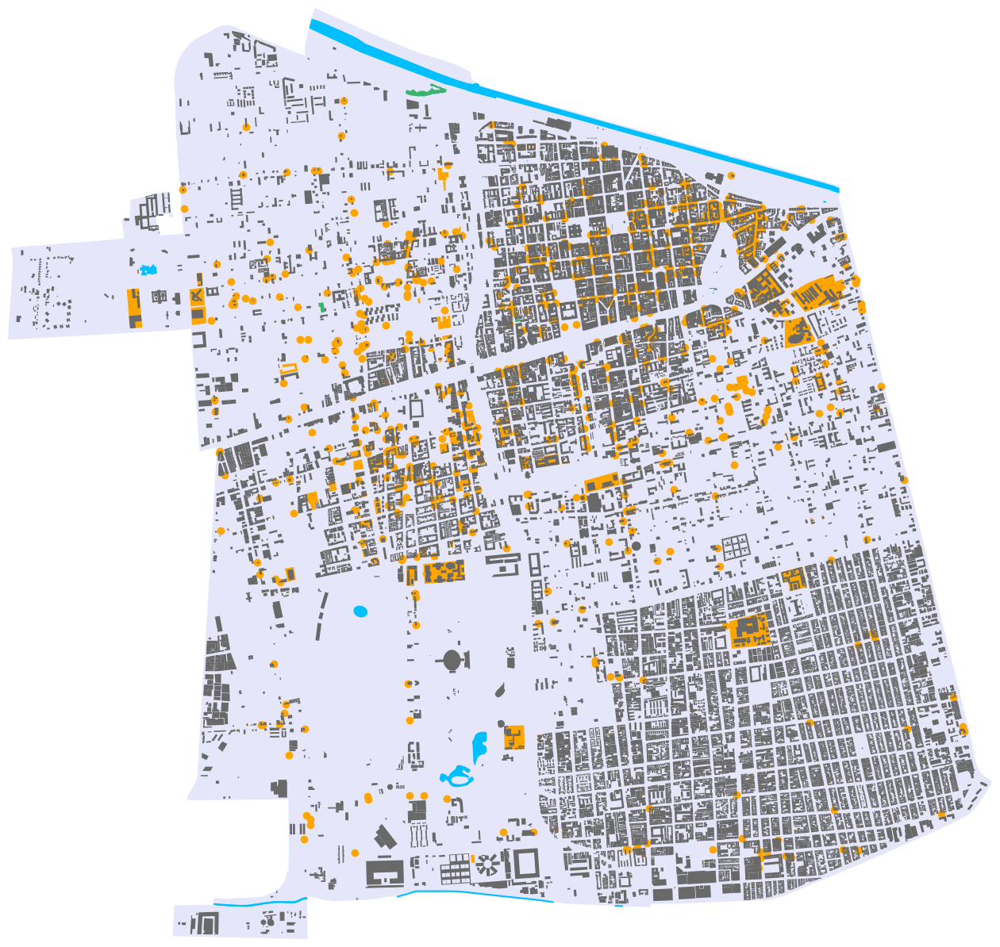

In [ ]:
ax = scl_gdf.plot(color="lavender", figsize=(16, 16))

# plot water
clipped_features_gdf.dropna(subset=["water", "waterway"], how="all").plot(
    ax=ax, color="deepskyblue"
)

# plot greenery
clipped_features_gdf[
    clipped_features_gdf["landuse"].isin(
        ["grass", "orchard", "flowerbed", "forest", "greenfield", "meadow"]
    )
].plot(ax=ax, color="mediumseagreen")

# plot amenities
clipped_features_gdf[
    clipped_features_gdf["amenity"].isin(
        ["restaurant", "veterinary", "food_court", "cafe", "hospital", "university",
        "police","childcare","social_centre"]
    )
].plot(ax=ax, color="orange")

# plot buildings
clipped_features_gdf.dropna(subset=["building"], how="all").plot(
    ax=ax, color="dimgray", markersize=0.1
)

xmin, ymin, xmax, ymax = scl_gdf.total_bounds
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

ax.set_axis_off()

In [ ]:
# uniques values for each colum
for column in scl_features_gdf.columns:
    if column != 'geometry':
        unique_values = scl_features_gdf[column].unique()
        print(f"Unique values for column '{column}': {unique_values}")


In [ ]:
clipped_features_gdf.tourism.unique()

array([None, 'viewpoint', 'gallery', 'information', 'artwork',
       'guest_house', 'apartment', 'hotel', 'motel', 'theme_park',
       'hostel', 'museum', 'attraction', 'yes'], dtype=object)

In [ ]:
clipped_features_gdf.leisure.unique()

array([None, 'swimming_pool', 'park', 'playground', 'pitch',
       'fitness_centre', 'sports_centre', 'garden', 'track', 'stadium',
       'dog_park', 'amusement_arcade', 'hackerspace', 'fitness_station',
       'adult_gaming_centre', 'dance', 'picnic_table'], dtype=object)

In [ ]:
clipped_features_gdf.building.unique()

array([None, 'industrial', 'yes', 'apartments', 'warehouse', 'house',
       'garage', 'commercial', 'church', 'retail', 'school', 'garages',
       'office', 'roof', 'residential', 'hospital', 'university',
       'train_station', 'construction', 'hotel', 'chapel', 'public',
       'service', 'kindergarten', 'ruins', 'fire_station', 'college',
       'bridge', 'transportation', 'government', 'civic', 'supermarket',
       'terrace', 'gatehouse'], dtype=object)

In [ ]:
clipped_features_gdf.landuse.unique()

array(['industrial', None, 'residential', 'construction', 'retail',
       'commercial', 'brownfield', 'military', 'railway',
       'recreation_ground', 'village_green', 'greenfield', 'flowerbed',
       'religious', 'cemetery', 'allotments', 'quarry', 'forest'],
      dtype=object)

In [ ]:
clipped_features_gdf.natural.unique()

array([None, 'water', 'wood', 'stone', 'bare_rock', 'cliff', 'peak'],
      dtype=object)

In [ ]:
clipped_features_gdf.amenity.unique()

array([None, 'car_rental', 'restaurant', 'parking_entrance',
       'place_of_worship', 'veterinary', 'bicycle_parking', 'marketplace',
       'food_court', 'fast_food', 'parking', 'post_office', 'school',
       'fountain', 'cafe', 'pharmacy', 'kindergarten',
       'bicycle_repair_station', 'nightclub', 'bicycle_rental', 'clinic',
       'community_centre', 'dentist', 'fuel', 'social_centre',
       'post_depot', 'hospital', 'theatre', 'internet_cafe', 'bench',
       'fire_station', 'waste_disposal', 'college', 'pub', 'university',
       'police', 'doctors', 'bank', 'social_facility', 'recycling', 'bbq',
       'library', 'atm', 'bar', 'courthouse', 'prison', 'shelter',
       'toilets', 'studio', 'car_wash', 'arts_centre', 'events_venue',
       'childcare', 'clock', 'casino', 'ice_cream', 'cinema', 'taxi',
       'public_bookcase', 'love_hotel', 'bus_station', 'bureau_de_change',
       'monastery', 'telephone', 'drinking_water', 'stripclub',
       'charging_station', 'townhall'

### Hex2vec embedder

R=8

In [ ]:
regionalizer = H3Regionalizer(resolution=8, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_8
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 25])
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)

#fit_transform
h3_embeddings_h2vec_filter_8 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_8, map=folium_map)

NameError: name 'H3Regionalizer' is not defined

In [ ]:
regionalizer = H3Regionalizer(resolution=8, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_8
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 25])
neighbourhood = H3Neighbourhood(regions_gdf_rm_8)

#fit_transform
h3_embeddings_h2vec_filter_8 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_8, map=folium_map)

Finished operation in 0:00:00

100%|██████████| 55/55 [00:00<00:00, 15843.87it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 5.5 K 
---------------------------------------
5.5 K     Trainable params
0         Non-trainable params
5.5 K     Total params
0.022     Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-package

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
h3_embeddings_h2vec_filter_8.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_8.csv')

r=9

In [ ]:
regionalizer = H3Regionalizer(resolution=9, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_9
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 25])
neighbourhood = H3Neighbourhood(regions_gdf_rm_9)

#fit_transform
h3_embeddings_h2vec_filter_9 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=129)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_9, map=folium_map)

Finished operation in 0:00:00

100%|██████████| 305/305 [00:00<00:00, 29895.60it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 5.5 K 
---------------------------------------
5.5 K     Trainable params
0         Non-trainable params
5.5 K     Total params
0.022     Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-packa

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
h3_embeddings_h2vec_filter_9.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_9.csv')

r=10

In [ ]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_10
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 50])
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)

#fit_transform
h3_embeddings_h2vec_filter_10 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_10, map=folium_map)

NameError: name 'H3Regionalizer' is not defined

geometry = True

In [ ]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")


In [ ]:
features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_10
joint = joiner.transform(regions, features,return_geom=True)

/usr/local/lib/python3.10/dist-packages/srai/loaders/osm_loaders/osm_pbf_loader.py:128: FutureWarning: Use `convert_geometry_to_geodataframe` instead. Deprecated since 0.8.1 version.
  features_gdf = pbf_reader.get_features_gdf_from_geometry(


In [ ]:
joint

geometry
region_id       feature_id                                                         
8ab2c5541d07fff way/948897852     LINESTRING (-70.66027 -33.43021, -70.66028 -33...
                way/1146079769    LINESTRING (-70.66026 -33.43023, -70.66114 -33...
8ab2c5541d2ffff way/948897852     LINESTRING (-70.66022 -33.43007, -70.66026 -33...
                way/1146079769    LINESTRING (-70.65895 -33.43056, -70.66026 -33...
8ab2c5541d27fff way/948897852     LINESTRING (-70.66019 -33.42997, -70.66021 -33...
...                                                                             ...
8ab2c554acaffff way/156367160     POLYGON ((-70.66684 -33.47397, -70.66684 -33.4...
8ab2c554ac47fff relation/7930710  POLYGON ((-70.66262 -33.47435, -70.66195 -33.4...
                way/385356556     MULTIPOLYGON (((-70.66207 -33.47421, -70.66250...
                way/1246403158    POLYGON ((-70.66207 -33.47421, -70.66209 -33.4...
8ab2c554ab9ffff way/387045128     POLYGON ((-70.65380 -33.47649, -70.65342 -33.4...

[35971 rows x 1 columns]

In [ ]:
embedder = Hex2VecEmbedder([150, 75, 50])
neighbourhood = H3Neighbourhood(regions_gdf_rm_10, include_center = True)

In [ ]:
neighbourhood

In [ ]:
#fit_transform
h3_embeddings_h2vec_filter_10_geometry = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

100%|██████████| 1915/1915 [00:00<00:00, 28293.97it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 63.1 K
---------------------------------------
63.1 K    Trainable params
0         Non-trainable params
63.1 K    Total params
0.253     Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-pac

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_10_geometry, map=folium_map)

In [ ]:
h3_embeddings_h2vec_filter_10_geometry.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_10_geometry.csv')

In [ ]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_10
joint = joiner.transform(regions, features,return_geom=True)

embedder = Hex2VecEmbedder([150, 75, 50])
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)

#fit_transform
h3_embeddings_h2vec_filter_10 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_10, map=folium_map)

In [ ]:
h3_embeddings_h2vec_filter_10.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_10.csv')

In [ ]:
regionalizer = H3Regionalizer(resolution=10, buffer=True)
joiner = IntersectionJoiner()
area = scl_gdf #scl_gdf = geocode_to_region_gdf("Santiago, Chile")

features = loader.load(area, HEX2VEC_FILTER)
regions = regions_gdf_rm_10
joint = joiner.transform(regions, features)

embedder = Hex2VecEmbedder([150, 75, 25])
neighbourhood = H3Neighbourhood(regions_gdf_rm_10)

#fit_transform
h3_embeddings_h2vec_filter_10 = embedder.fit_transform(
          regions,
          features,
          joint,
          neighbourhood,
          trainer_kwargs={"max_epochs": 10, "accelerator": "gpu"},
          batch_size=128)

folium_map = plot_regions(area, colormap=["rgba(0,0,0,0.1)"], tiles_style="CartoDB positron")
plot_numeric_data(regions, 0, h3_embeddings_h2vec_filter_10, map=folium_map)

Finished operation in 0:00:00

100%|██████████| 1915/1915 [00:00<00:00, 30712.29it/s]
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/configuration_validator.py:74: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type       | Params
---------------------------------------
0 | encoder | Sequential | 63.1 K
---------------------------------------
63.1 K    Trainable params
0         Non-trainable params
63.1 K    Total params
0.253     Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-pac

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


## geom

In [ ]:
#h3_embeddings_h2vec_filter_10_geometry.reset_index(inplace=True)

In [ ]:
h3_embeddings_h2vec_filter_10_geometry

,region_id,0,1,2,3,4,5,6,7,8,...,42,43,44,45,46,47,48,49,lat,lon
0,8ab2c554ac1ffff,-0.405615,-0.022194,0.353425,-0.133727,-0.257163,0.263371,0.102343,-0.238431,-0.005873,...,-0.563070,-0.131716,-0.149724,-0.175769,0.031954,0.416099,0.063792,0.135876,-33.474219,-70.665500
1,8ab2c554c60ffff,0.496070,-0.288900,-0.060947,0.374537,-0.202863,0.113270,0.164523,-0.457816,-0.299115,...,0.220537,-0.109595,-0.183250,0.173716,-0.443150,0.027653,-0.185963,0.127526,-33.456503,-70.637651
2,8ab2c554810ffff,-0.496768,0.574781,0.199736,0.449911,0.381179,-0.212425,0.385244,0.379306,0.099255,...,0.219561,0.175924,0.143675,-0.259998,-0.006546,0.244448,-0.103484,-0.132793,-33.466403,-70.635485
3,8ab2c5540a67fff,-0.190828,-0.071388,-0.282133,-0.221223,-0.084737,0.177861,-0.116056,-0.209688,0.268767,...,-0.293238,0.159685,0.331523,0.152027,-0.194559,-0.128383,-0.180791,-0.101549,-33.428131,-70.663346
4,8ab2c5541247fff,0.303481,0.082322,0.033443,-0.139035,0.139435,-0.218599,-0.442476,-0.280265,-0.095079,...,0.232528,0.000258,-0.127595,-0.312810,0.057305,-0.018985,0.173424,-0.464375,-33.445909,-70.646848
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1910,8ab2c555d857fff,0.089977,-0.110011,-0.168858,-0.147994,-0.256893,0.423129,-0.099982,-0.066868,0.057185,...,-0.110748,-0.166110,0.214365,0.056227,-0.321235,-0.075971,-0.183638,-0.258003,-33.463626,-70.674697
1911,8ab2c554acc7fff,-0.861588,0.028559,0.033928,-0.260003,-0.029844,-0.212416,-0.074264,-0.044307,0.565317,...,-0.570372,0.358500,0.138442,0.103243,0.265217,0.243238,0.039662,0.439815,-33.476040,-70.665229
1912,8ab2c554392ffff,0.311007,-0.029246,-0.068732,-0.008078,-0.056901,0.280767,-0.165808,0.244798,0.063382,...,0.083445,-0.252741,0.082739,0.124060,-0.421225,-0.153143,-0.154976,-0.105253,-33.439046,-70.672808
1913,8ab2c554a8dffff,-0.265075,0.039224,0.132762,-0.022887,-0.024040,-0.228007,-0.176568,0.064115,0.195555,...,-0.393431,0.185040,0.121241,-0.195482,0.184287,0.319773,0.013117,0.246173,-33.475482,-70.656304


In [ ]:
h3_embeddings_h2vec_filter_10_geometry.to_csv('/content/drive/MyDrive/UC-TESIS/data/embeddings/hex2vec_150-75-50/h3_embeddings_h2vec_filter_10_geometry.csv')

In [ ]:
# de hexagono a lat lon
h3.cell_to_latlng('8ab2c5548127fff')


(-33.46458280646202, -70.63575614845847)

In [ ]:
#find center of hex for visualization
h3_embeddings_h2vec_filter_10_geometry['lat'] = h3_embeddings_h2vec_filter_10_geometry["region_id"].apply(lambda x: h3.cell_to_latlng(x)[0])
h3_embeddings_h2vec_filter_10_geometry['lon'] = h3_embeddings_h2vec_filter_10_geometry["region_id"].apply(lambda x: h3.cell_to_latlng(x)[1])



---
no


In [ ]:
# create Point object based on hex latlng
h3_embeddings_h2vec_filter_10_geometry['geometry'] = h3_embeddings_h2vec_filter_10_geometry.apply(lambda x: shapely.geometry.Point(x.lng,x.lat),1)
h3_embeddings_h2vec_filter_10_geometry.crs = {"init": "epsg:4326"}

In [ ]:

# plot hex latlng
h3_embeddings_h2vec_filter_10_geometry.plot(x='lng',y='lat',style='.',alpha=.1,figsize=(12,12));
plt.title('hex-grid: nyc')
dfh = GeoDataFrame(h3_embeddings_h2vec_filter_10_geometry)
# Intersect Hex Point with CT Polygon
df_ct = geopandas.tools.sjoin(gdf, h3_embeddings_h2vec_filter_10_geometry, how="inner")
df_ct.sample(3)